In [1]:
import numpy as np 
import pandas as pd 
import json
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
from datetime import datetime
import glob
import seaborn as sns
import re
import os
import io
from scipy.stats import boxcox

In [2]:
acs = pd.read_csv('US_Accidents_Dec21_updated.csv')
print("The shape of data is:",(acs.shape))

The shape of data is: (2845342, 47)


In [3]:
print('The Dataset Contains, Rows: {:,d} & Columns: {}'.format(acs.shape[0], acs.shape[1]))

The Dataset Contains, Rows: 2,845,342 & Columns: 47


In [4]:
display(acs.head())

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747,At OH-4/OH-235/Exit 41 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055,At I-71/US-50/Exit 1 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Day
3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123,At Dart Ave/Exit 21 - Accident.,...,False,False,False,False,False,False,Night,Night,Day,Day
4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day


In [5]:
display(acs.tail())

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
2845337,A-2845338,2,2019-08-23 18:03:25,2019-08-23 18:32:01,34.00248,-117.37936,33.99888,-117.37094,0.543,At Market St - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day
2845338,A-2845339,2,2019-08-23 19:11:30,2019-08-23 19:38:23,32.76696,-117.14806,32.76555,-117.15363,0.338,At Camino Del Rio/Mission Center Rd - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day
2845339,A-2845340,2,2019-08-23 19:00:21,2019-08-23 19:28:49,33.77545,-117.84779,33.77740,-117.85727,0.561,At Glassell St/Grand Ave - Accident. in the ri...,...,False,False,False,False,False,False,Day,Day,Day,Day
2845340,A-2845341,2,2019-08-23 19:00:21,2019-08-23 19:29:42,33.99246,-118.40302,33.98311,-118.39565,0.772,At CA-90/Marina Fwy/Jefferson Blvd - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day
2845341,A-2845342,2,2019-08-23 18:52:06,2019-08-23 19:21:31,34.13393,-117.23092,34.13736,-117.23934,0.537,At Highland Ave/Arden Ave - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day


In [6]:
cm = sns.light_palette("green", as_cmap=True)
acs.head().style.background_gradient(cmap=cm)

C:\Users\User\anaconda3\lib\site-packages\pandas\io\formats\style.py:3555: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(gmap) if vmin is None else vmin
C:\Users\User\anaconda3\lib\site-packages\pandas\io\formats\style.py:3556: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(gmap) if vmax is None else vmax


,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Number,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230000,Between Sawmill Rd/Exit 20 and OH-315/Olentangy Riv Rd/Exit 22 - Accident.,nan,Outerbelt E,R,Dublin,Franklin,OH,43017,US,US/Eastern,KOSU,2016-02-08 00:53:00,42.100000,36.100000,58.000000,29.760000,10.000000,SW,10.400000,0.000000,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747000,At OH-4/OH-235/Exit 41 - Accident.,nan,I-70 E,R,Dayton,Montgomery,OH,45424,US,US/Eastern,KFFO,2016-02-08 05:58:00,36.900000,nan,91.000000,29.680000,10.000000,Calm,nan,0.020000,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night
2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055000,At I-71/US-50/Exit 1 - Accident.,nan,I-75 S,R,Cincinnati,Hamilton,OH,45203,US,US/Eastern,KLUK,2016-02-08 05:53:00,36.000000,nan,97.000000,29.700000,10.000000,Calm,nan,0.020000,Overcast,False,False,False,False,True,False,False,False,False,False,False,False,False,Night,Night,Night,Day
3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123000,At Dart Ave/Exit 21 - Accident.,nan,I-77 N,R,Akron,Summit,OH,44311,US,US/Eastern,KAKR,2016-02-08 06:54:00,39.000000,nan,55.000000,29.650000,10.000000,Calm,nan,nan,Overcast,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Day,Day
4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500000,At Mitchell Ave/Exit 6 - Accident.,nan,I-75 S,R,Cincinnati,Hamilton,OH,45217,US,US/Eastern,KLUK,2016-02-08 07:53:00,37.000000,29.800000,93.000000,29.690000,10.000000,WSW,10.400000,0.010000,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Day,Day,Day,Day


In [7]:
#statistical
acs.describe().style.background_gradient(cmap=cm) 

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,2845342.000000,2845342.000000,2845342.000000,2845342.000000,2845342.000000,2845342.000000,1101431.000000,2776068.000000,2375699.000000,2772250.000000,2786142.000000,2774796.000000,2687398.000000,2295884.000000
mean,2.137572,36.245201,-97.114633,36.245321,-97.114387,0.702678,8089.408114,61.793556,59.658231,64.365452,29.472344,9.099391,7.395044,0.007017
std,0.478722,5.363797,18.317819,5.363873,18.317632,1.560361,18360.093995,18.622629,21.160967,22.874568,1.045286,2.717546,5.527454,0.093488
min,1.000000,24.566027,-124.548074,24.566013,-124.545748,0.000000,0.000000,-89.000000,-89.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,33.445174,-118.033113,33.446278,-118.033331,0.052000,1270.000000,50.000000,46.000000,48.000000,29.310000,10.000000,3.500000,0.000000
50%,2.000000,36.098609,-92.418076,36.097987,-92.417718,0.244000,4007.000000,64.000000,63.000000,67.000000,29.820000,10.000000,7.000000,0.000000
75%,2.000000,40.160243,-80.372431,40.161049,-80.373383,0.764000,9567.000000,76.000000,76.000000,83.000000,30.010000,10.000000,10.000000,0.000000
max,4.000000,49.000580,-67.113167,49.075000,-67.109242,155.186000,9999997.000000,196.000000,196.000000,100.000000,58.900000,140.000000,1087.000000,24.000000


In [8]:
acs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2845342 entries, 0 to 2845341
Data columns (total 47 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Severity               int64  
 2   Start_Time             object 
 3   End_Time               object 
 4   Start_Lat              float64
 5   Start_Lng              float64
 6   End_Lat                float64
 7   End_Lng                float64
 8   Distance(mi)           float64
 9   Description            object 
 10  Number                 float64
 11  Street                 object 
 12  Side                   object 
 13  City                   object 
 14  County                 object 
 15  State                  object 
 16  Zipcode                object 
 17  Country                object 
 18  Timezone               object 
 19  Airport_Code           object 
 20  Weather_Timestamp      object 
 21  Temperature(F)         float64
 22  Wind_Chill(F)     

In [9]:
acs.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Number', 'Street',
       'Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [10]:
len(acs)

2845342

# Explatory Data Analysis

# Location Attribute

### Analysis of Latitude and Longtitude

Displays of data pages regarding Latitude and Longtitude

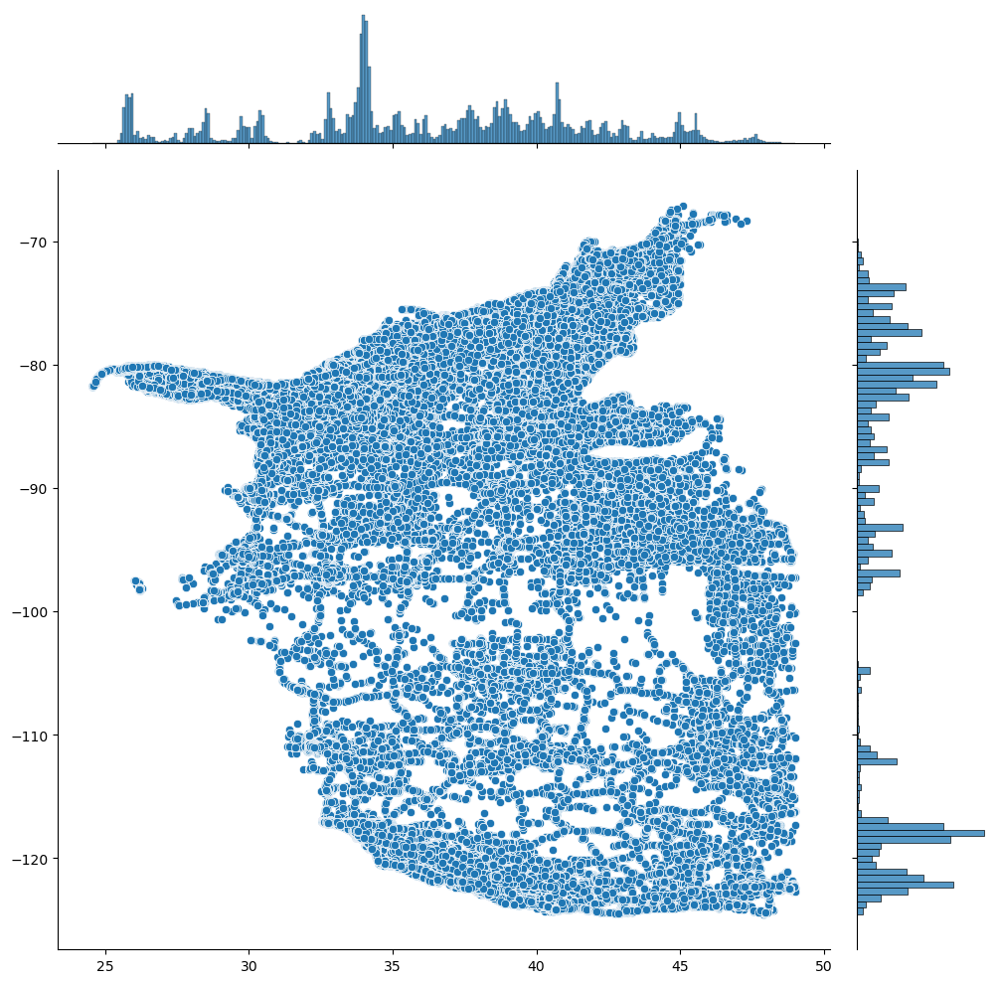

In [11]:
sns.jointplot(x= acs.Start_Lat.values,y=acs.Start_Lng.values,height=10)
plt.ylabel('Start_Lat', fontsize=12)
plt.xlabel('Start_Lng', fontsize=12)
plt.show()

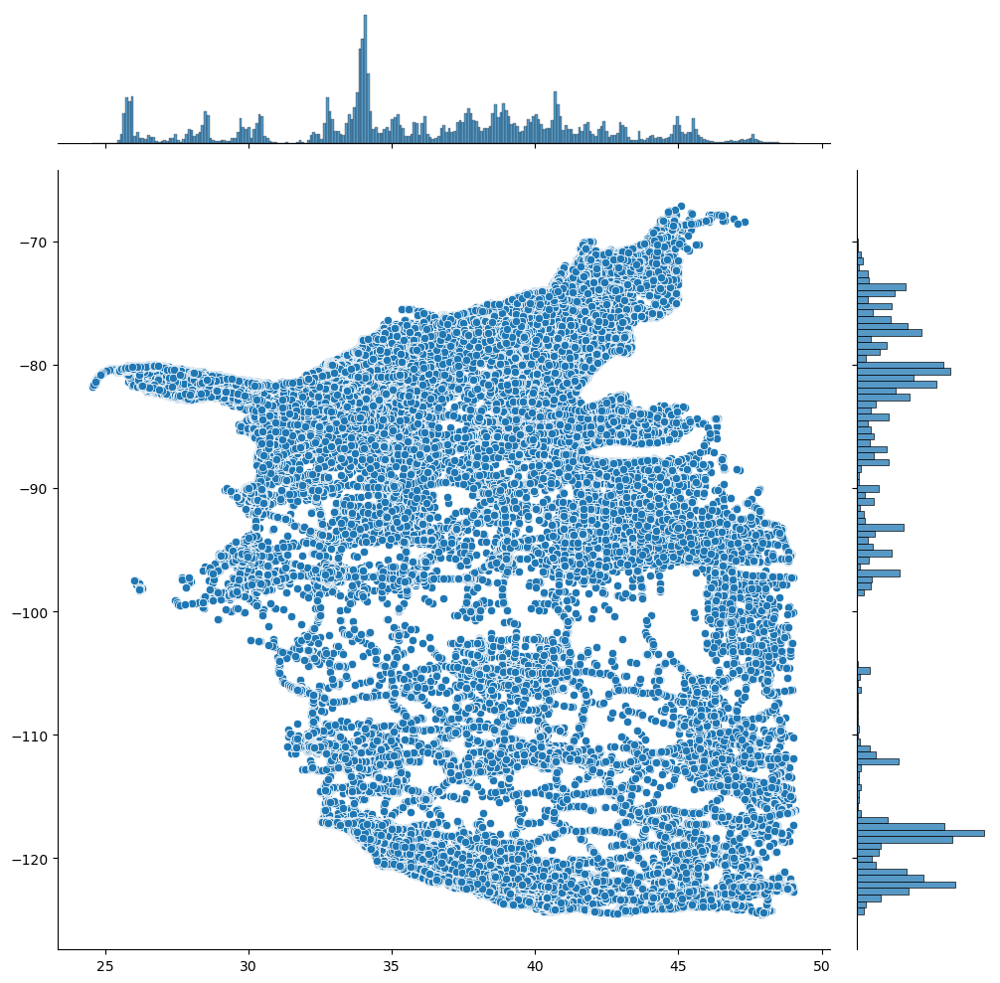

In [12]:
sns.jointplot(x= acs.End_Lat.values,y= acs.End_Lng.values,height=10)
plt.ylabel('End_Lat', fontsize=12)
plt.xlabel('End_Lng', fontsize=12)
plt.show()

## Analysis of the Map

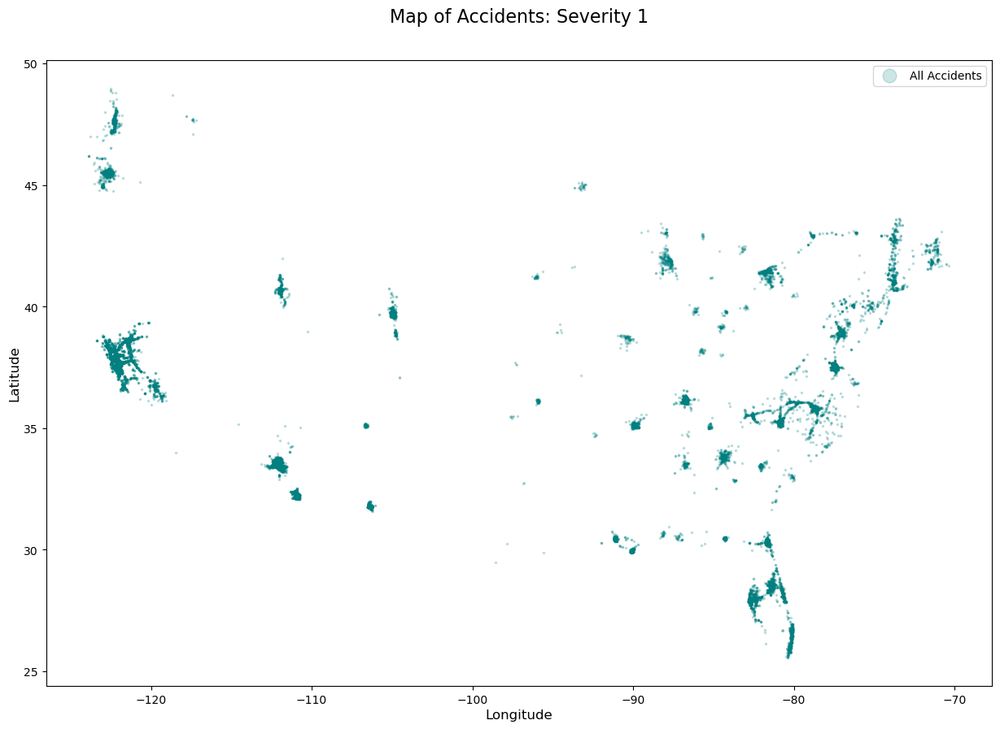

In [13]:
acs_severity = acs[acs['Severity']==1]


plt.figure(figsize=(15,10))

plt.plot( 'Start_Lng', 'Start_Lat', data=acs_severity, linestyle='', marker='o', markersize=1.5, color="teal", alpha=0.2, label='All Accidents')
#plt.plot( 'End_Lng', 'End_Lat', data=acs_severity, linestyle='', marker='o', markersize=3, color="coral", alpha=0.5, label='Accidents of Serverity')
plt.legend(markerscale=8)
plt.xlabel('Longitude', size=12, labelpad=3)
plt.ylabel('Latitude', size=12, labelpad=3)
plt.title('Map of Accidents: Severity 1', size=16, y=1.05)
plt.show()

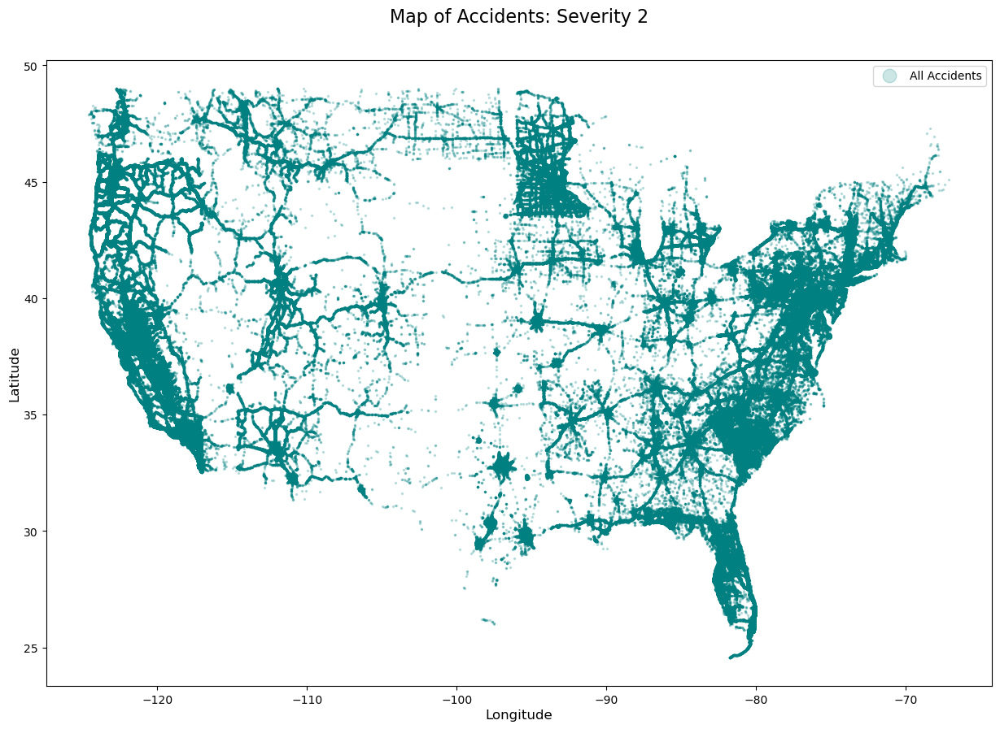

In [14]:
acs_severity1 = acs[acs['Severity']==2]


plt.figure(figsize=(15,10))

plt.plot( 'Start_Lng', 'Start_Lat', data=acs_severity1, linestyle='', marker='o', markersize=1.5, color="teal", alpha=0.2, label='All Accidents')
#plt.plot( 'End_Lng', 'End_Lat', data=acs_severity1, linestyle='', marker='o', markersize=3, color="coral", alpha=0.5, label='Accidents of Serverity')
plt.legend(markerscale=8)
plt.xlabel('Longitude', size=12, labelpad=3)
plt.ylabel('Latitude', size=12, labelpad=3)
plt.title('Map of Accidents: Severity 2', size=16, y=1.05)
plt.show()

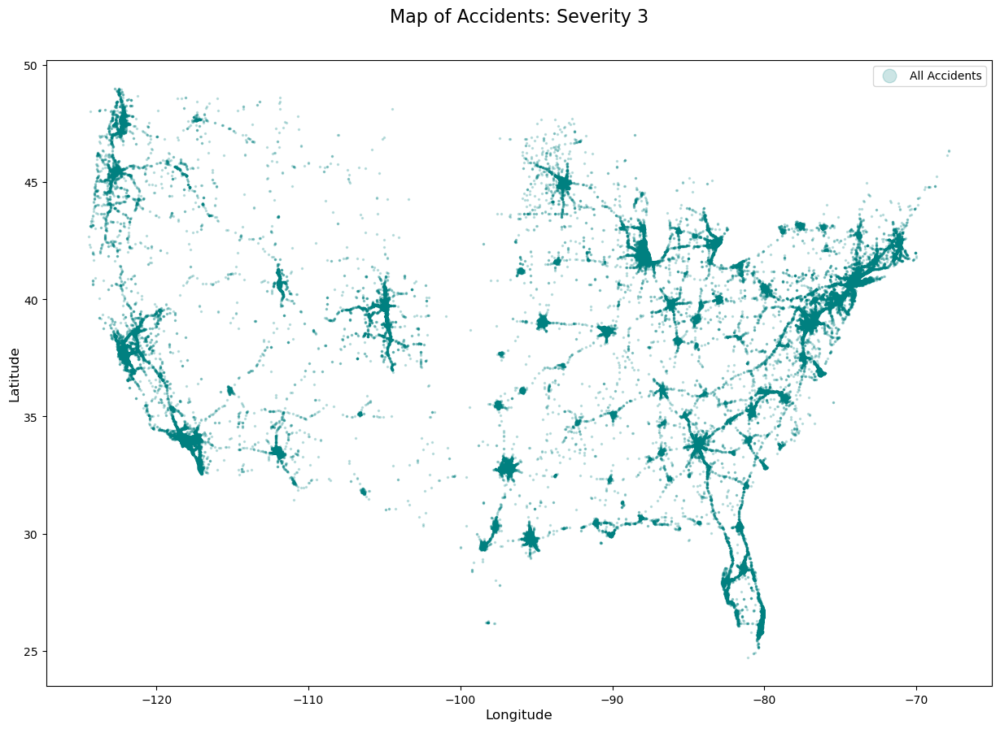

In [15]:
acs_severity2 = acs[acs['Severity']==3]


plt.figure(figsize=(15,10))

plt.plot( 'Start_Lng', 'Start_Lat', data=acs_severity2, linestyle='', marker='o', markersize=1.5, color="teal", alpha=0.2, label='All Accidents')
#plt.plot( 'End_Lng', 'End_Lat', data=acs_severity2, linestyle='', marker='o', markersize=3, color="coral", alpha=0.5, label='Accidents of Serverity')
plt.legend(markerscale=8)
plt.xlabel('Longitude', size=12, labelpad=3)
plt.ylabel('Latitude', size=12, labelpad=3)
plt.title('Map of Accidents: Severity 3', size=16, y=1.05)
plt.show()

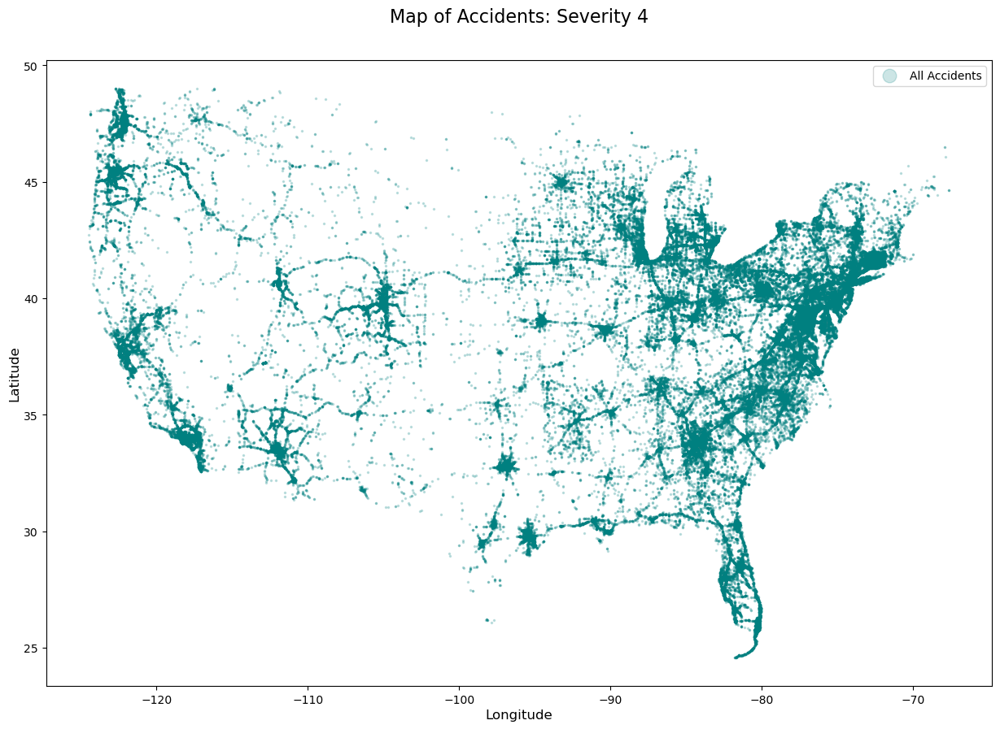

In [16]:
acs_severity3 = acs[acs['Severity']==4]


plt.figure(figsize=(15,10))

plt.plot( 'Start_Lng', 'Start_Lat', data=acs_severity3, linestyle='', marker='o', markersize=1.5, color="teal", alpha=0.2, label='All Accidents')
#plt.plot( 'Start_Lng', 'Start_Lng', data=acs_severity3, linestyle='', marker='o', markersize=3, color="coral", alpha=0.5, label='Accidents of Serverity')
plt.legend(markerscale=8)
plt.xlabel('Longitude', size=12, labelpad=3)
plt.ylabel('Latitude', size=12, labelpad=3)
plt.title('Map of Accidents: Severity 4', size=16, y=1.05)
plt.show()

In [17]:
import plotly.graph_objects as go

state_count_acc = pd.value_counts(acs['State'])

fig = go.Figure(data=go.Choropleth(
    locations=state_count_acc.index,
    z = state_count_acc.values.astype(float),
    locationmode = 'USA-states',
    colorscale = 'Reds',
    colorbar_title = "Count Accidents",
))

fig.update_layout(
    title_text = '2016 - 2021 US Traffic Accident Dataset by State',
    geo_scope='usa',
)

fig.show()

In [18]:
!pip install plotly-geo

In [19]:
data_sever = acs.sample(n=10000)

fig = go.Figure(data=go.Scattergeo(
        locationmode = 'USA-states',
        lon = data_sever['Start_Lng'],
        lat = data_sever['Start_Lat'],
        text = data_sever['City'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
        colorscale = 'Reds',
        cmin = data_sever['Severity'].max(),
        color = data_sever['Severity'],
        cmax = 1,
        colorbar_title="Severity"
        )))

fig.update_layout(
        title = 'Severity of Road Accidents',
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.7,
            subunitwidth = 0.7
        ),
    )
fig.show()

### Distance and Severity

In [20]:
data_sever = acs.sample(n=15000)[['Start_Lng','Start_Lat','City','Distance(mi)','Severity']]
data_sever.dropna(inplace=True)

fig = go.Figure(data=go.Scattergeo(
        locationmode = 'USA-states',
        lon = data_sever['Start_Lng'],
        lat = data_sever['Start_Lat'],
        text = data_sever['City'],
        mode = 'markers',
        marker = dict(
            size = data_sever['Distance(mi)'],
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Viridis',
            cmin = data_sever['Severity'].max(),
        color = data_sever['Severity'],
        cmax = 1,
            colorbar_title="Severity"
        )))

fig.update_layout(
        title = 'Severity and Distance of Road Accidents',
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.7,
            subunitwidth = 0.7
        ),
    )
fig.show()

# Analysis of the Location

### Analysis of the City

In [21]:
# create a dataframe of city and their corresponding accident cases
city_acs = pd.DataFrame(acs['City'].value_counts()).reset_index().rename(columns={'index':'City', 'City':'Cases'})

In [22]:
top_10_cities = pd.DataFrame(city_acs.head(10))

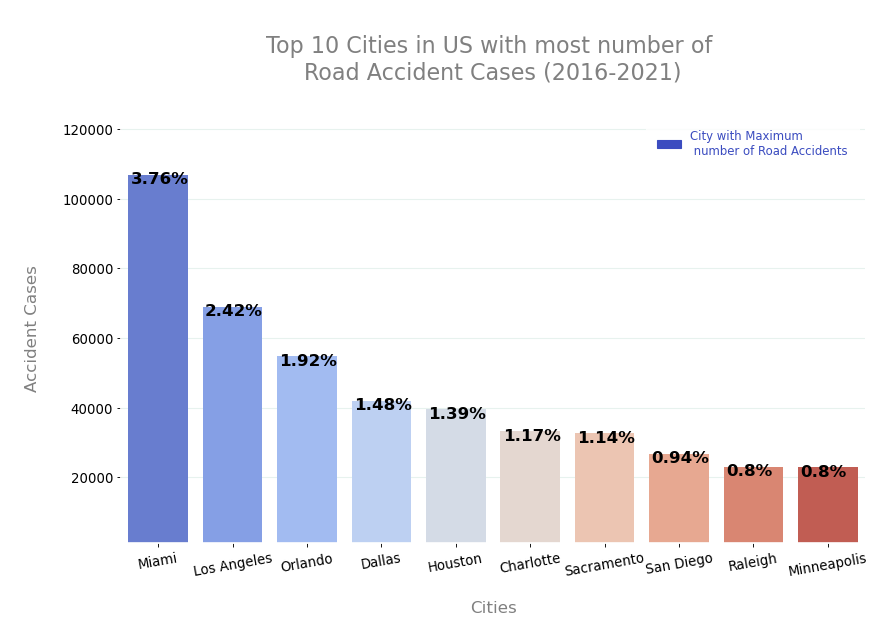

In [23]:
import matplotlib as mpl

fig, ax = plt.subplots(figsize = (12,7), dpi = 80)

cmap = mpl.cm.get_cmap('coolwarm', 10)   
clrs = [mpl.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]

ax=sns.barplot(y=top_10_cities['Cases'], x=top_10_cities['City'], palette='coolwarm')

total = sum(city_acs['Cases'])
for i in ax.patches:
    ax.text(i.get_x()+.03, i.get_height()-2500, \
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=15, weight='bold',
                color='black')

plt.title('\nTop 10 Cities in US with most number of \nRoad Accident Cases (2016-2021)\n', size=20, color='grey')

plt.ylim(1000, 125000)
plt.xticks(rotation=10, fontsize=12)
plt.yticks(fontsize=12)

ax.set_xlabel('\nCities\n', fontsize=15, color='grey')
ax.set_ylabel('\nAccident Cases\n', fontsize=15, color='grey')

for i in ['bottom', 'left']:
    ax.spines[i].set_color('white')
    ax.spines[i].set_linewidth(1.5)
    
right_side = ax.spines["right"]
right_side.set_visible(False)
top_side = ax.spines["top"]
top_side.set_visible(False)

ax.set_axisbelow(True)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=.3)
MA = mpl.patches.Patch(color=clrs[0], label='City with Maximum\n number of Road Accidents')
ax.legend(handles=[MA], prop={'size': 10.5}, loc='best', borderpad=1, 
          labelcolor=clrs[0], edgecolor='white');
plt.show()

#### An estimation of 16% road accidents within the past 6 years were recorded from these 10 cities out of 21,621 cities within the US.

1) Miami has the highest number of road accidents within US, garnering 3.76% number of road accidents within US between 2016-2021.

2) Los Angeles is the second highest number of road accidents within US, garnering 2.39% number of road accidents within US between 2016-2021.

3) Orlando is the third highest number of road accidents within US, garnering 1.92% number of road accidents within US between 2016-2021.

In [24]:
hightest_cases = city_acs.Cases[0]
print(round(hightest_cases/5))
print(round(hightest_cases/(5*365)))

21393
59


#### Highest cases of road accidents regarding Cities within US

1) Within the past 6 years between 2016 to 2021. There are 21,393 road accidents on average occuring in Miami

2) Averaging in every 1 hour 2 accidents occuring within Miami.

In [25]:
def city_cases_percentage(val, operator):
    if operator == '<':
        res = city_acs[city_acs['Cases']<val].shape[0]
    elif operator == '>':
        res = city_acs[city_acs['Cases']>val].shape[0]
    elif operator == '=':
        res = city_acs[city_acs['Cases']==val].shape[0]
    print(f'{res} Cities, {round(res*100/city_acs.shape[0], 2)}%')
    
    
city_cases_percentage(1, '=')
city_cases_percentage(100, '<')
city_cases_percentage(1000, '<')
city_cases_percentage(1000, '>')
city_cases_percentage(5000, '>')
city_cases_percentage(10000, '>')

1110 Cities, 9.5%
8727 Cities, 74.71%
11185 Cities, 95.75%
494 Cities, 4.23%
71 Cities, 0.61%
34 Cities, 0.29%


#### Within this Dataset, there are 21,621 cities recorded.

1) 1110 cities (9.5% of the overall cities) within the US recorded 1 accident occuring within the past 6 years.

2) 8727 cities (74.71% of the overall cities) within the US recorded acquiring less than 100 road accident occuring within the past 6 years.

3) 11185 cities (95.75% of the overall cities) within the US recorded acquiring less than 1,000 road accident occuring within the past 6 years.

4) 494 cities (4.23% of the overall cities) within the US recorded acquiring more than 1,000 road accident occuring within the past 6 years.

5) 71 cities (4.23% of the overall cities) within the US recorded acquiring more than 5,000 road accident occuring within the past 6 years.

6) 34 cities (0.29% of the overall cities) within the US recorded acquiring more than 10,000 road accident occuring within the past 6 years.

## Analysis of the State

In [26]:
 # create a dictionary using US State code and their corresponding Name
us_states = {'AK': 'Alaska',
 'AL': 'Alabama',
 'AR': 'Arkansas',
 'AS': 'American Samoa',
 'AZ': 'Arizona',
 'CA': 'California',
 'CO': 'Colorado',
 'CT': 'Connecticut',
 'DC': 'District of Columbia',
 'DE': 'Delaware',
 'FL': 'Florida',
 'GA': 'Georgia',
 'GU': 'Guam',
 'HI': 'Hawaii',
 'IA': 'Iowa',
 'ID': 'Idaho',
 'IL': 'Illinois',
 'IN': 'Indiana',
 'KS': 'Kansas',
 'KY': 'Kentucky',
 'LA': 'Louisiana',
 'MA': 'Massachusetts',
 'MD': 'Maryland',
 'ME': 'Maine',
 'MI': 'Michigan',
 'MN': 'Minnesota',
 'MO': 'Missouri',
 'MP': 'Northern Mariana Islands',
 'MS': 'Mississippi',
 'MT': 'Montana','NC': 'North Carolina',
 'ND': 'North Dakota',
 'NE': 'Nebraska',
 'NH': 'New Hampshire',
 'NJ': 'New Jersey',
 'NM': 'New Mexico',
 'NV': 'Nevada',
 'NY': 'New York',
 'OH': 'Ohio',
 'OK': 'Oklahoma',
 'OR': 'Oregon',
 'PA': 'Pennsylvania',
 'PR': 'Puerto Rico',
 'RI': 'Rhode Island',
 'SC': 'South Carolina',
 'SD': 'South Dakota',
 'TN': 'Tennessee',
 'TX': 'Texas',
 'UT': 'Utah',
 'VA': 'Virginia',
 'VI': 'Virgin Islands',
 'VT': 'Vermont',
 'WA': 'Washington',
 'WI': 'Wisconsin',
 'WV': 'West Virginia',
 'WY': 'Wyoming'}

# create a dataframe of State and their corresponding accident cases
state_acs = pd.DataFrame(acs['State'].value_counts()).reset_index().rename(columns={'index':'State', 'State':'Cases'})


# Function to convert the State Code with the actual corressponding Name
def convert(x): return us_states[x]

state_acs['State'] = state_acs['State'].apply(convert)


top_ten_states_name = list(state_acs['State'].head(10))

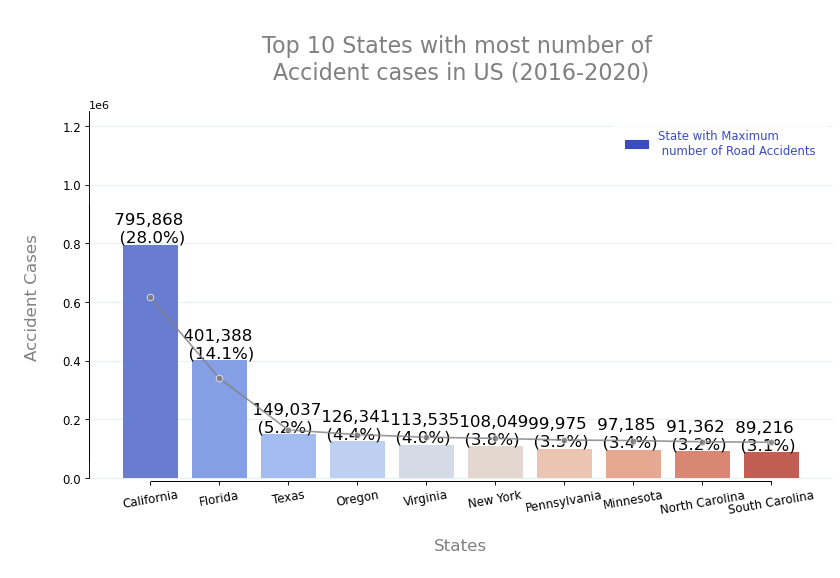

In [27]:
fig, ax = plt.subplots(figsize = (12,6), dpi = 80)

cmap = mpl.cm.get_cmap('coolwarm', 10)   
clrs = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]

ax=sns.barplot(y=state_acs['Cases'].head(10), x=state_acs['State'].head(10), palette='coolwarm')
ax1 = ax.twinx()
sns.lineplot(data = state_acs[:10], marker='o', x='State', y='Cases', color = 'grey', alpha = .8)


total = acs.shape[0]
for i in ax.patches:
    ax.text(i.get_x()-0.2, i.get_height()+10000, \
            ' {:,d}\n  ({}%) '.format(int(i.get_height()), round(100*i.get_height()/total, 1)), fontsize=15,
                color='black')


ax.set(ylim =(-10000, 1250000))
ax1.set(ylim =(-100000, 1700000))

plt.title('\nTop 10 States with most number of \nAccident cases in US (2016-2020)\n', size=20, color='grey')
ax1.axes.yaxis.set_visible(False)
ax.set_xlabel('\nStates\n', fontsize=15, color='grey')
ax.set_ylabel('\nAccident Cases\n', fontsize=15, color='grey')

for i in ['top','right']:
    side1 = ax.spines[i]
    side1.set_visible(False)
    side2 = ax1.spines[i]
    side2.set_visible(False)
    
ax.set_axisbelow(True)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=.3)

ax.spines['bottom'].set_bounds(0.005, 9)
ax.spines['left'].set_bounds(0, 1250000)
ax1.spines['bottom'].set_bounds(0.005, 9)
ax1.spines['left'].set_bounds(0, 1250000)
ax.tick_params(axis='y', which='major', labelsize=10.6)
ax.tick_params(axis='x', which='major', labelsize=10.6, rotation=10)

MA = mpl.patches.Patch(color=clrs[0], label='State with Maximum\n number of Road Accidents')
ax.legend(handles=[MA], prop={'size': 10.5}, loc='best', borderpad=1, 
          labelcolor=clrs[0], edgecolor='white');

#### Highest Cases of road accidents regarding States within US

1) California has the highest number of road accidents within the past 6 years, garnering 795,868 number of road accidents. 28% of the total accidents recorded is from California.

~ Within the past 6 years, there are 363 road accidents occuring daily within California

~ Approximately 15 accidents per hour road accidents occuring within California

2) Florida has the second highest number of road accidents within the past 6 years, garnering 401,388 number of road accidents. 14.1% of the total accidents recorded is from Florida.

~ Within the past 6 years there are 183 road accidents occuring daily within Florida

~ Approximately 7 accidents per hour road accidents occuring within Florida

3) Texas has the third highest number of road accidents within the past 6 years, garnering 149,037 number of road accidents. 5.2% of the total accidents recorded is from Texas.

~ Within the past 6 years there are 68 road accidents occuring daily within Texas

~ Approximately 2 accidents per hour road accidents occuring within Texas

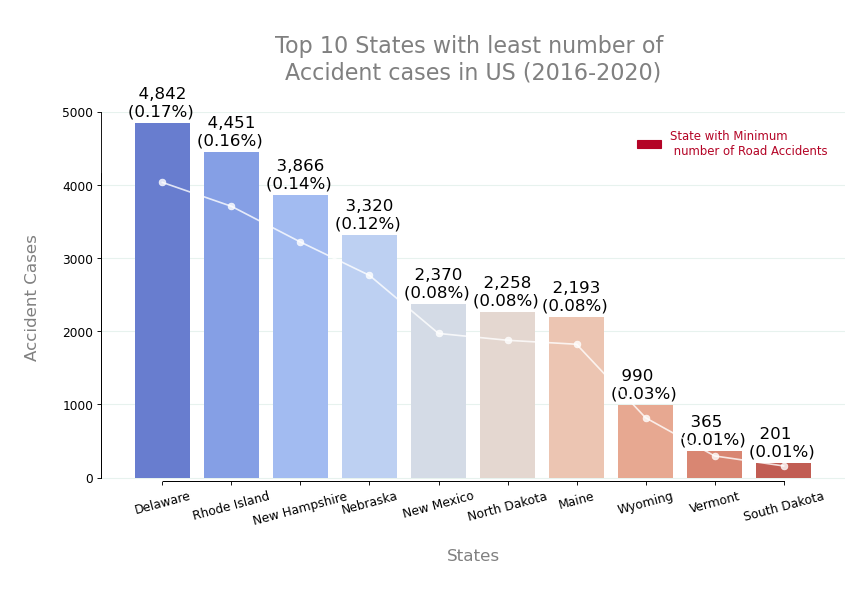

In [28]:
fig, ax = plt.subplots(figsize = (12,6), dpi = 80)

cmap = mpl.cm.get_cmap('coolwarm', 10)   
clrs = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]

ax=sns.barplot(y=state_acs['Cases'].tail(10), x=state_acs['State'].tail(10), palette='coolwarm')
ax1 = ax.twinx()
sns.lineplot(data = state_acs[-10:], marker='o', x='State', y='Cases', color = 'white', alpha = .8)

total = acs.shape[0]
for i in ax.patches:
    ax.text(i.get_x()-0.1, i.get_height()+100, \
            '  {:,d}\n({}%) '.format(int(i.get_height()), round(100*i.get_height()/total, 2)), fontsize=15,
                color='black')
ax.set(ylim =(-50, 5000))
ax1.set(ylim =(-50, 6000))

plt.title('\nTop 10 States with least number of \nAccident cases in US (2016-2020)\n', size=20, color='grey')
ax1.axes.yaxis.set_visible(False)
ax.set_xlabel('\nStates\n', fontsize=15, color='grey')
ax.set_ylabel('\nAccident Cases\n', fontsize=15, color='grey')

for i in ['top', 'right']:
    side = ax.spines[i]
    side.set_visible(False)
    side1 = ax1.spines[i]
    side1.set_visible(False)
    
    
ax.set_axisbelow(True)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=.3)

ax.spines['bottom'].set_bounds(0.005, 9)
ax.spines['left'].set_bounds(0, 5000)
ax1.spines['bottom'].set_bounds(0.005, 9)
ax1.spines['left'].set_bounds(0, 5000)
ax.tick_params(axis='y', which='major', labelsize=11)
ax.tick_params(axis='x', which='major', labelsize=11, rotation=15)

MI = mpl.patches.Patch(color=clrs[-1], label='State with Minimum\n number of Road Accidents')
ax.legend(handles=[MI], prop={'size': 10.5}, loc='best', borderpad=1, 
          labelcolor=clrs[-1], edgecolor='white');

#### Lowest cases of road accidents regarding States within US

1) South Dakota is recorded to be the city with the lowest number of road accidents within the past 6 years between 2016 to 2021, garnering 201 road accidents recorded between 2016 to 2021. Total of 0.01% road accidents recorded from South Dakota

~ Approximately 33 road accidents occurs yearly

2) Vermont is the city with the second lowest number of road accidents within the past 6 years between 2016 to 2021, garnering 365 road accidents recorded between 2016 to 2021. Total of 0.01% road accidents recorded from Vermont

~ Approximately 60 road accidents occurs yearly

3) Wyoming is the city with the third lowest number of road accidents within the past 6 years between 2016 to 2021, garnering 990 road accidents recorded between 2016 to 2021. Total of 0.03% road accidents recorded from Vermont

~ Approximately 165 road accidents occurs yearly


In [29]:
severity_sum = acs['Severity'].sum()

In [30]:
print("Sum of column {}: {}".format('Severity', severity_sum))

Sum of column Severity: 6082122


## Analysis of the Street

In [31]:
street_acs = pd.DataFrame(acs['Street'].value_counts()).reset_index().rename(columns={'index':'Street No.', 'Street':'Cases'})

In [32]:
top_streets_acs = pd.DataFrame(street_acs.head(10))

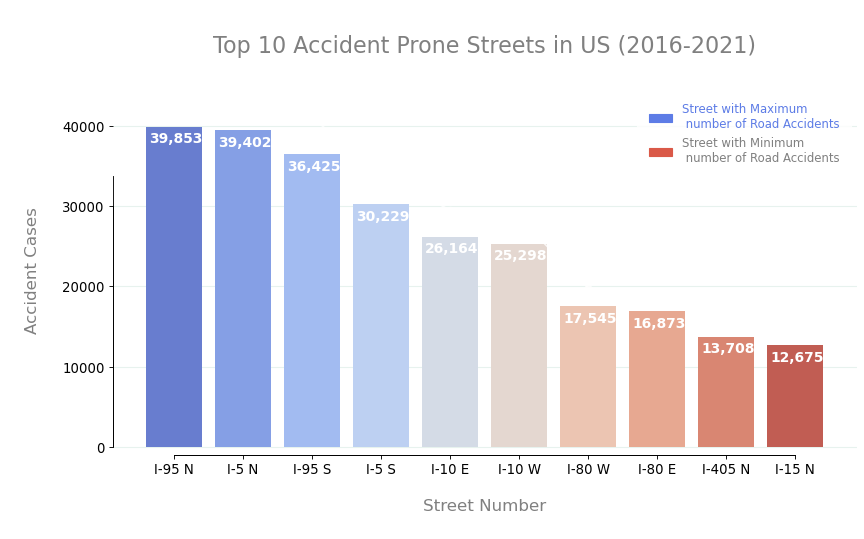

In [33]:
fig, ax = plt.subplots(figsize = (12,6), dpi = 80)
        
cmap = mpl.cm.get_cmap('coolwarm', 10)   
clrs = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]

ax = sns.barplot( y = top_streets_acs['Cases'], x = top_streets_acs['Street No.'], palette ='coolwarm')
ax1 = ax.twinx()
sns.lineplot(data = top_streets_acs, marker = 'o', x = 'Street No.', y = 'Cases', color = 'white', alpha = .8)

total = acs.shape[0]
for i in ax.patches:
    ax.text(i.get_x()+0.04, i.get_height() - 2000, \
            '{:,d}'.format(int(i.get_height())), fontsize = 12.5, weight = 'bold',
                color = 'white')
ax.axes.set_ylim(-1000, 45000)
ax1.axes.set_ylim(-1000, 40000)
plt.title('\nTop 10 Accident Prone Streets in US (2016-2021)\n', size=20, color='grey')

ax1.axes.yaxis.set_visible(False)
ax.set_xlabel('\nStreet Number\n', fontsize = 15, color = 'grey')
ax.set_ylabel('\nAccident Cases\n', fontsize = 15, color = 'grey')

for i in ['top','right']:
    side1 = ax.spines[i]
    side1.set_visible(False)
    side2 = ax1.spines[i]
    side2.set_visible(False)

    
ax.set_axisbelow(True)
ax.grid(color = '#b2d6c7', linewidth = 1, axis = 'y', alpha = .3)

ax.spines['bottom'].set_bounds(0.005, 9)
ax.spines['left'].set_bounds(0, 30000)
ax1.spines['bottom'].set_bounds(0.005, 9)
ax1.spines['left'].set_bounds(0, 30000)
ax.tick_params(axis = 'both', which ='major', labelsize = 12)

MA = mpl.patches.Patch(color = clrs[1], label = 'Street with Maximum\n number of Road Accidents')
MI = mpl.patches.Patch(color = clrs[-2], label = 'Street with Minimum\n number of Road Accidents')
ax.legend(handles = [MA, MI], prop = {'size': 10.5}, loc = 'best', borderpad = 1, 
          labelcolor = [clrs[1], 'grey'], edgecolor = 'white');

#### Highest Cases of road accidents regarding Streets within US

1) Street I-95 N has the highest number of road accidents within the past 6 years between 2016 to 2021, garnering 39,853 number of road accidents.

~ Within the past 6 years, there are approximately 18 road accidents occuring daily at Street I-95 N.

~ Approximately 2 accidents in every 2 hours road accidents are recorded occuring within Street I-95 N.

2) Street I-5 N has the second highest number of road accidents within the past 6 years between 2016 to 2021, garnering 39,402 number of road accidents.

~ Within the past 6 years there are approximately 18 road accidents occuring daily at Street I-5 N.

~ Approximately 2 accidents in every 2 hours road accidents are recorded occuring within Street I-5 N.

3) Street I-95 S has the third highest number of road accidents within the past 6 years between 2016 to 2021, garnering 36,425 number of road accidents.

~ Within the past 6 years there are approximately 17 road accidents occuring daily at Street I-95 S.

~ Approximately 2 accidents in every 2 hours road accidents are recorded occuring within Street I-95 S.

In [34]:
def street_percent(val, operator):
    if operator == '=':
        val = street_acs[street_acs['Cases']==val].shape[0]
    elif operator == '>':
        val = street_acs[street_acs['Cases']>val].shape[0]
    elif operator == '<':
        val = street_acs[street_acs['Cases']<val].shape[0]
    print('{:,d} Streets, {}%'.format(val, round(val*100/street_acs.shape[0], 2)))
    
    
street_percent(1, '=')
street_percent(100, '<')
street_percent(1000, '<')
street_percent(1000, '>')
street_percent(5000, '>')

64,154 Streets, 40.18%
156,364 Streets, 97.94%
159,325 Streets, 99.8%
325 Streets, 0.2%
56 Streets, 0.04%


#### Within this Dataset, there are a total of 380,224 Streets recorded road accidents.

1) 64,154 Streets (40.18% of the overall streets) are recorded within the past 6 years between 2016 to 2021.

2) 156,364 Streets (97.94% of the overall streets) within the US recorded acquiring less than 100 road accident occuring within the past 6 years between 2016 to 2021.

3) 159,325 Streets (99.8% of the overall streets) within the US recorded acquiring less than 1000 road accident occuring within the past 6 years between 2016 to 2021.

4) 325 Streets (0.2% of the overall streets) within the US recorded acquiring more than 1,000 road accident occuring within the past 6 years between 2016 to 2021.

4) 56 Streets (0.0.4% of the overall streets) within the US recorded acquiring more than 5,000 road accident occuring within the past 6 years between 2016 to 2021.

### Analysis of road accident near the Airport

In [35]:
ac_acs = pd.DataFrame(acs['Airport_Code'].value_counts()).reset_index().rename(columns={'index':'Airport_Code', 'Airport_Code':'Cases'})

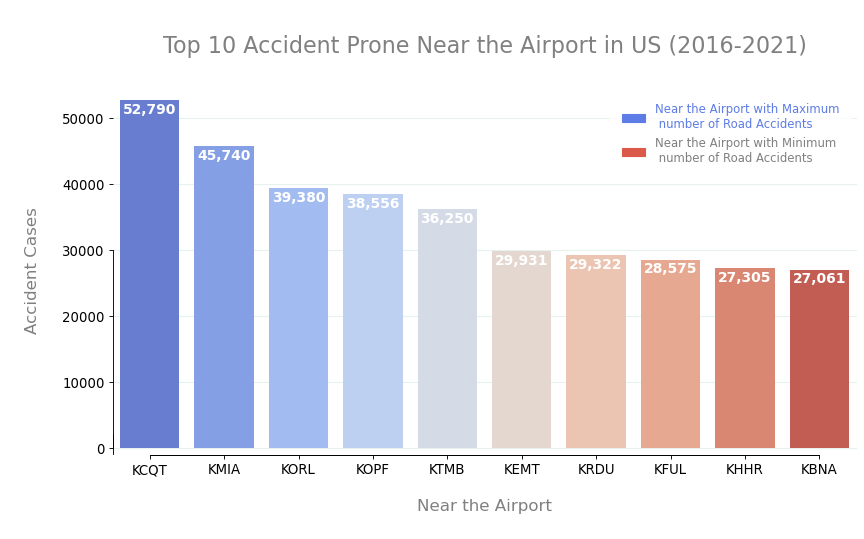

In [36]:
ac_acs = pd.DataFrame(acs['Airport_Code'].value_counts()).reset_index().rename(columns={'index':'Airport_Code', 'Airport_Code':'Cases'})

# sort the dataframe in descending order based on 'Cases'
ac_acs = ac_acs.sort_values(by='Cases', ascending=False)

# select the top 10 rows
ac_acs = ac_acs.head(10)

fig, ax = plt.subplots(figsize = (12,6), dpi = 80)
        
cmap = mpl.cm.get_cmap('coolwarm', 10)   
clrs = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]

ax = sns.barplot( y = ac_acs['Cases'], x = ac_acs['Airport_Code'], palette ='coolwarm')
ax1 = ax.twinx()

total = acs.shape[0]
for i in ax.patches:
    ax.text(i.get_x()+0.04, i.get_height() - 2000, \
            '{:,d}'.format(int(i.get_height())), fontsize = 12.5, weight = 'bold',
                color = 'white')
ax.axes.set_ylim(-1000, 55000)
ax1.axes.set_ylim(-1000, 550000)
plt.title('\nTop 10 Accident Prone Near the Airport in US (2016-2021)\n', size=20, color='grey')

ax1.axes.yaxis.set_visible(False)
ax.set_xlabel('\nNear the Airport\n', fontsize = 15, color = 'grey')
ax.set_ylabel('\nAccident Cases\n', fontsize = 15, color = 'grey')

for i in ['top','right']:
    side1 = ax.spines[i]
    side1.set_visible(False)
    side2 = ax1.spines[i]
    side2.set_visible(False)

    
ax.set_axisbelow(True)
ax.grid(color = '#b2d6c7', linewidth = 1, axis = 'y', alpha = .3)

ax.spines['bottom'].set_bounds(0.005, 9)
ax.spines['left'].set_bounds(0, 30000)
ax1.spines['bottom'].set_bounds(0.005, 9)
ax1.spines['left'].set_bounds(0, 30000)
ax.tick_params(axis = 'both', which ='major', labelsize = 12)

MA = mpl.patches.Patch(color = clrs[1], label = 'Near the Airport with Maximum\n number of Road Accidents')
MI = mpl.patches.Patch(color = clrs[-2], label = 'Near the Airport with Minimum\n number of Road Accidents')
ax.legend(handles = [MA, MI], prop = {'size': 10.5}, loc = 'best', borderpad = 1, 
          labelcolor = [clrs[1], 'grey'], edgecolor = 'white');

plt.show()


#### Analysis of road accident near the Airport

1) KCQT airport code garnered the highest road accident, acquiring 52, 790 cases of road accidents

2) KMIA airport code garnered the second highest road accident, acquiring 45, 740 cases of road accidents

3) KORL airport code garnered the third highest road accident, acquiring 39, 380 cases of road accidents

### Map

In [37]:
data_sever1 = acs.sample(n=15000)[['Start_Lng','Start_Lat','City','Airport_Code','Severity']]
data_sever1.dropna(inplace=True)

fig = go.Figure(data=go.Scattergeo(
        locationmode = 'USA-states',
        lon = data_sever1['Start_Lng'],
        lat = data_sever1['Start_Lat'],
        text = data_sever1['City'],
        mode = 'markers',
        marker = dict(
            size = data_sever1['Severity']*2,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            symbol = 'circle',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Viridis',
            cmin = data_sever1['Severity'].max(),
            color = data_sever1['Severity'],
            cmax = 1,
            colorbar_title="Severity"
        )))

fig.update_layout(
        title = 'Severity near the Airport of Road Accidents',
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.7,
            subunitwidth = 0.7
        ),
    )
fig.show()


# Time Attribute

## Analysis of the Accident Duration of Traffic Flow

In [38]:
acs['Start_Time'] = pd.to_datetime(acs['Start_Time'])
acs['End_Time'] = pd.to_datetime(acs['End_Time'])

In [39]:
acs['Year']=acs['Start_Time'].dt.year
acs['Month']=acs['Start_Time'].dt.strftime('%b')
acs['Day']=acs['Start_Time'].dt.day
acs['Hour']=acs['Start_Time'].dt.hour
acs['Weekday']=acs['Start_Time'].dt.strftime('%a')

In [40]:
td='Time_Duration(min)'
acs[td]=round((acs['End_Time']-acs['Start_Time'])/np.timedelta64(1,'m'))

In [41]:
accident_duration_df = pd.DataFrame(acs['End_Time'] - acs['Start_Time']).reset_index().rename(columns={'index':'Id', 0:'Duration'})

In [42]:
top_10_accident_duration_df = pd.DataFrame(accident_duration_df['Duration'].value_counts().head(10).sample(frac = 1)).reset_index().rename(columns={'index':'Duration', 'Duration':'Cases'})

Duration = [str(i).split('days')[-1].strip() for i in top_10_accident_duration_df.Duration]

top_10_accident_duration_df['Duration'] = Duration

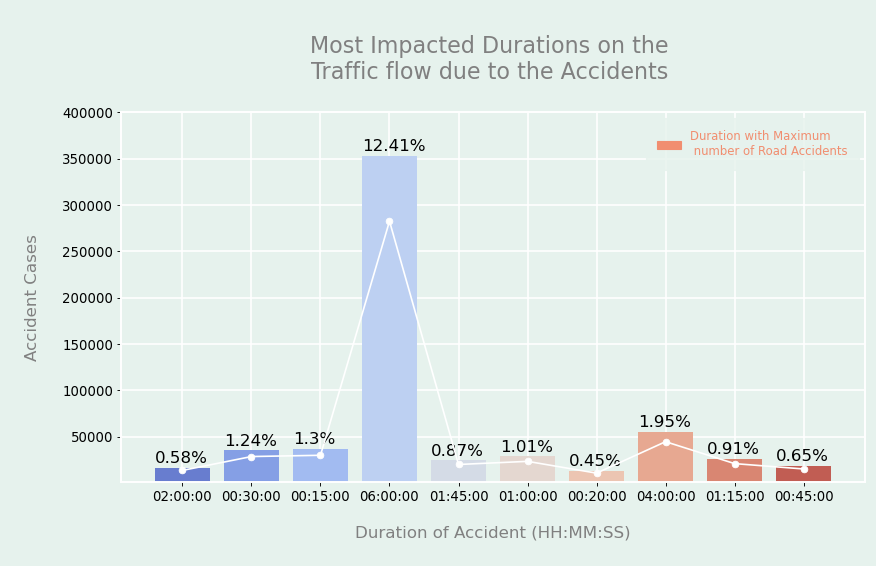

In [43]:
fig, ax = plt.subplots(figsize = (12,6), dpi = 80)
ax.set_facecolor('#e6f2ed')
fig.patch.set_facecolor('#e6f2ed')

cmap = mpl.cm.get_cmap('coolwarm', 10)   
clrs = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]

ax=sns.barplot(y=top_10_accident_duration_df['Cases'], x=top_10_accident_duration_df['Duration'], palette='coolwarm')
ax1 = ax.twinx()
sns.lineplot(data = top_10_accident_duration_df, marker='o', x='Duration', y='Cases', color = 'white', alpha = 1)

total = acs.shape[0]
for i in ax.patches:
    ax.text(i.get_x(), i.get_height()+5000, \
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=15,
                color='black')

ax.set(ylim =(1000, 400000))
ax1.set(ylim =(1000, 500000))

plt.title('\nMost Impacted Durations on the \nTraffic flow due to the Accidents \n', size=20, color='grey')

ax1.axes.yaxis.set_visible(False)
ax.set_xlabel('\nDuration of Accident (HH:MM:SS)\n', fontsize=15, color='grey')
ax.set_ylabel('\nAccident Cases\n', fontsize=15, color='grey')

for i in ['bottom', 'top', 'left', 'right']:
    ax.spines[i].set_color('white')
    ax.spines[i].set_linewidth(1.5)
    ax1.spines[i].set_color('white')
    ax1.spines[i].set_linewidth(1.5)
    
ax.set_axisbelow(True)
ax.grid(color='white', linewidth=1.5)
ax.tick_params(axis='both', which='major', labelsize=12)
MA = mpl.patches.Patch(color=clrs[-3], label='Duration with Maximum\n number of Road Accidents')
ax.legend(handles=[MA], prop={'size': 10.5}, loc='best', borderpad=1, 
          labelcolor=clrs[-3], facecolor='#e6f2ed', edgecolor='#e6f2ed');

#### Highest case of accident duration

1) The highest duration which is 12.41% of the road accident recorded incurred traffic flow within the 6 hours period.

2) The second highest duration which is 1.9% of the road accident recorded incurred traffic flow within the 4 hours period.

### Mean of the Duration

Calculating duration time due to the difference between end time and start time in minutes and calculating the mean of the duration.

In [44]:
acs['Duration'] = acs.End_Time - acs.Start_Time 
acs['Duration'] = acs['Duration'].apply(lambda x:round(x.total_seconds() / 60) )
print("The overall mean duration is: ", (round(acs['Duration'].mean(),3)), 'min')


The overall mean duration is:  359.038 min


#### The overall mean duration of the accident is 359.038 minutes which is equal to approximately 5.98 hours.

## Yearly Analysis

In [45]:
year_acs = pd.DataFrame(acs.Start_Time.dt.year.value_counts()).reset_index().rename(columns={'index':'Year', 'Start_Time':'Cases'}).sort_values(by='Cases', ascending=True)

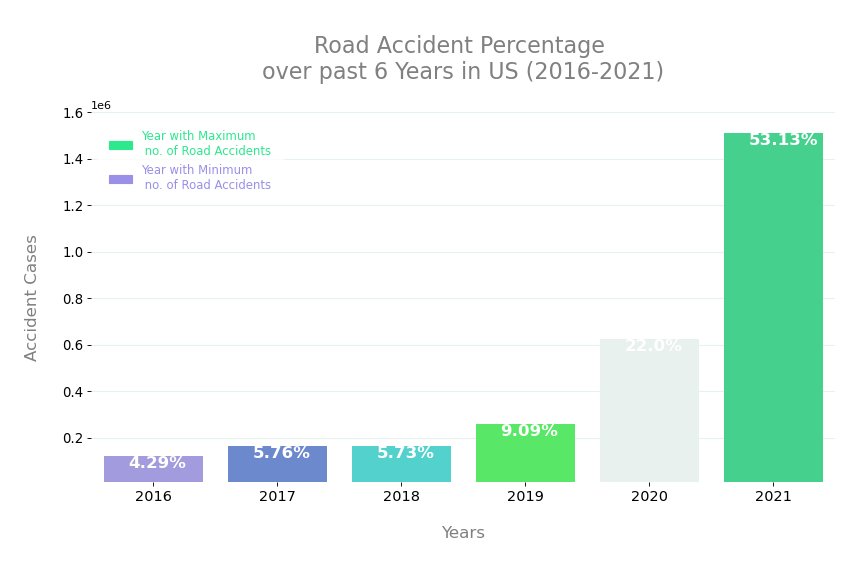

In [46]:
fig, ax = plt.subplots(figsize = (12,6), dpi = 80)

ax=sns.barplot(y=year_acs['Cases'], x=year_acs['Year'], palette=['#9a90e8', '#5d82de', '#3ee6e0', '#40ff53', '#e6f2ed', '#2ee88e'])

total = acs.shape[0]
for i in ax.patches:
    ax.text(i.get_x()+0.2, i.get_height()-50000, \
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=15,weight='bold',
                color='white')

plt.ylim(10000, 1600000)
plt.title('\nRoad Accident Percentage \nover past 6 Years in US (2016-2021)\n', size=20, color='grey')
plt.ylabel('\nAccident Cases\n', fontsize=15, color='grey')
plt.xlabel('\nYears\n', fontsize=15, color='grey')
plt.xticks(fontsize=13)
plt.yticks(fontsize=12)
for i in ['bottom', 'top', 'left', 'right']:
    ax.spines[i].set_color('white')
    ax.spines[i].set_linewidth(1.5)
    

for k in ['top', 'right', "bottom", 'left']:
        side = ax.spines[k]
        side.set_visible(False)

ax.set_axisbelow(True)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=0.3)
MA = mpl.patches.Patch(color='#2ee88e', label='Year with Maximum\n no. of Road Accidents')
MI = mpl.patches.Patch(color='#9a90e8', label='Year with Minimum\n no. of Road Accidents')
ax.legend(handles=[MA, MI], prop={'size': 10.5}, loc='best', borderpad=1, 
          labelcolor=['#2ee88e', '#9a90e8'], edgecolor='white');
plt.show()

#### Highest cases of yearly road accidents

It is evident that the accidents has increased significantly between 2019 to 2021. The year of 2020 and 2021, the road accidents occured has substantially increased in comparison to the years of 2016, 2017, 2018 and 2019.

1) Between the year of 2020 and 2021, 75.13% of the total road accident occured during those 2 years were recorded within the past 6 years.

2) In the year of 2021 alone more than 50% (53.13%) of the road accidents were recorded. 

3) 22% of the road accidents were recorded in the year of 2020.

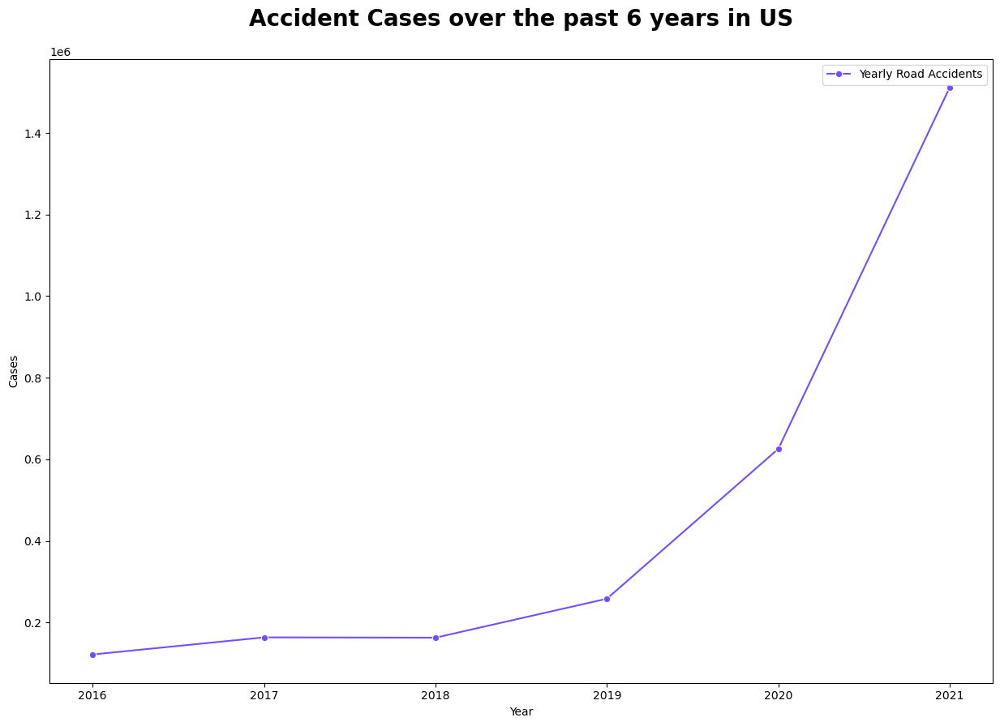

In [47]:
fig = plt.subplots(figsize=(15, 10))
plt.title('Accident Cases over the past 6 years in US\n', fontsize=20,fontweight ="bold", color='black')
count = 0
years = ['2016', '2017', '2018', '2019', '2020', '2021']

sns.lineplot(data = year_acs, marker='o', x='Year', y='Cases', color = '#734dff', label="Yearly Road Accidents");

for k in ['bottom', 'top', 'left', 'right']:
        side.set_visible(False)


### Analysis of the Yearly Road Accident based on Severity

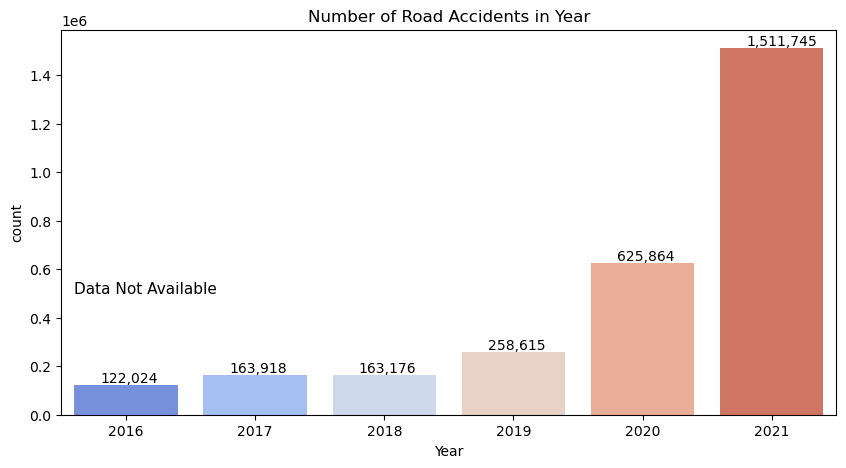

In [48]:
fig, ax = plt.subplots(figsize = (10,5))
c = sns.countplot(x="Year", data=acs, orient = 'v', palette = "coolwarm")
plt.annotate('Data Not Available',xy=(-0.4,500000), fontsize=11)
c.set_title("Number of Road Accidents in Year")
for i in ax.patches:
    count = '{:,.0f}'.format(i.get_height())
    x = i.get_x()+i.get_width()-0.60
    y = i.get_height()+10000
    ax.annotate(count, (x, y))
plt.show()

#### Yearly road accident based on Severity

1) In the year of 2021 1,511,745 road accidents occurred.

2) In the year of 2020 625,864 road accidents occured.

## Analysis of Monthly Road Accident

In [49]:
year_acs = pd.DataFrame(acs.Start_Time.dt.month.value_counts()).reset_index().rename(columns={'index':'Month', 'Start_Time':'Cases'}).sort_values(by='Cases', ascending=True)

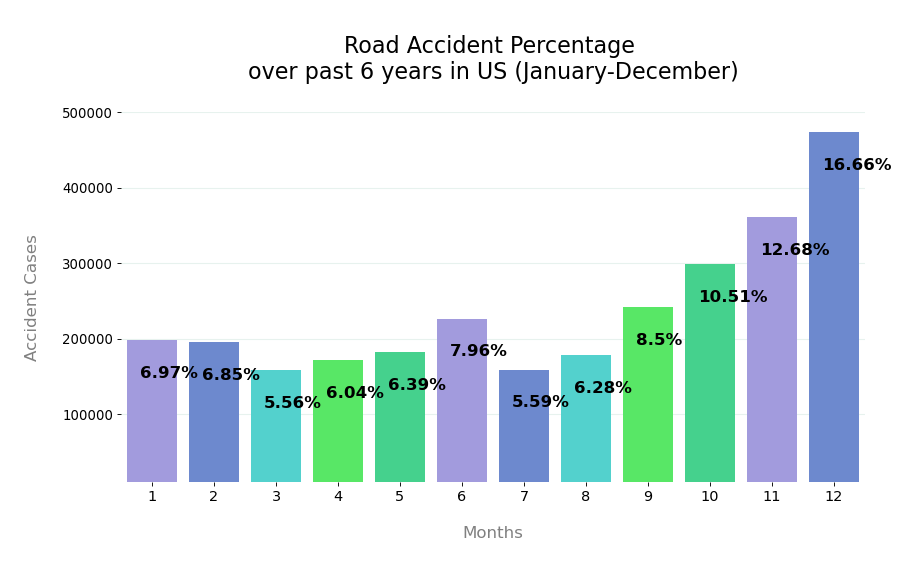

In [50]:
fig, ax = plt.subplots(figsize = (12,6), dpi = 80)


ax = sns.barplot(y = year_acs['Cases'], x = year_acs['Month'], palette = ['#9a90e8', '#5d82de', '#3ee6e0', '#40ff53','#2ee88e'])

total = acs.shape[0]
for i in ax.patches:
    ax.text(i.get_x()+0.2, i.get_height()-50000, \
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=15,weight='bold',
                color='black')

plt.ylim(10000, 500000)
plt.title('\nRoad Accident Percentage \nover past 6 years in US (January-December)\n', size=20, color='black')
plt.ylabel('\nAccident Cases\n', fontsize=15, color='grey')
plt.xlabel('\nMonths\n', fontsize=15, color='grey')
plt.xticks(fontsize=13)
plt.yticks(fontsize=12)
for i in ['bottom', 'top', 'left', 'right']:
    ax.spines[i].set_color('white')
    ax.spines[i].set_linewidth(1.5)
    

for k in ['top', 'right', "bottom", 'left']:
        side = ax.spines[k]
        side.set_visible(False)

ax.set_axisbelow(True)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=0.3)

plt.show()

#### Analysis of the monthly accidents

#### It is evident that the accidents has increased significantly during the winter months. The road accidents occured has substantially increased in comparison to the year.

1) Between the months of September and December, 48.28% of the total road accident occured during those 4 months were recorded within the past 6 years.

2) In the month of December approximately 16.6% of the road accidents were recorded within the past 6 years

### Monthly Analysis by Severity

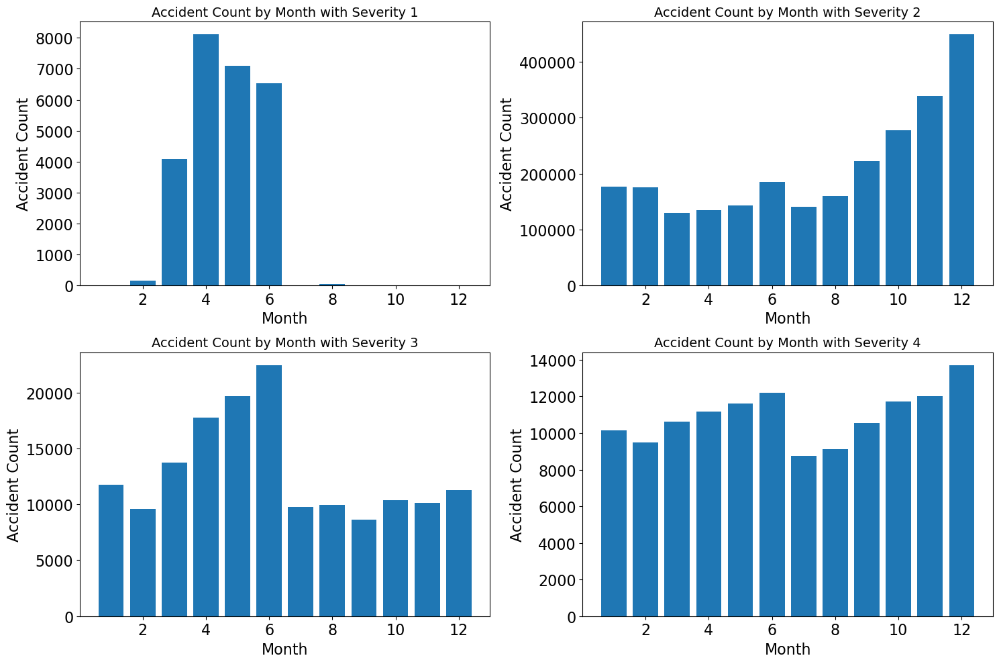

In [51]:
acs['time'] = pd.to_datetime(acs.Start_Time, format='%Y-%m-%d %H:%M:%S')

plt.subplots(2,2,figsize=(15,10))
for s in np.arange(1,5):
    plt.subplot(2,2,s)
    plt.hist(pd.DatetimeIndex(acs.loc[acs["Severity"] == s]['time']).month, bins=[1,2,3,4,5,6,7,8,9,10,11,12,13], align='left', rwidth=0.8)
    plt.title("Accident Count by Month with Severity " + str(s), fontsize=14)
    plt.xlabel("Month", fontsize=16)
    plt.ylabel("Accident Count", fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
plt.tight_layout()
plt.show()

### Analysis of the Daily Road Accident

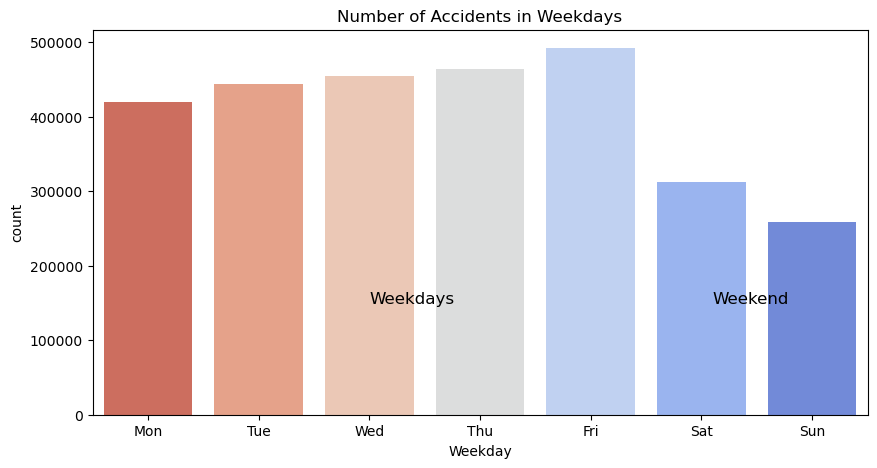

In [52]:
fig, ax = plt.subplots(figsize = (10,5))
c = sns.countplot(x="Weekday", data = acs, orient = 'v', palette = "coolwarm_r")
plt.annotate('Weekdays',xy=(2,150000), fontsize=12)
plt.annotate('Weekend',xy=(5.1,150000), fontsize=12)
c.set_title("Number of Accidents in Weekdays")
plt.show()

In [53]:
day_acs = pd.DataFrame(acs.Start_Time.dt.day_name().value_counts()).reset_index().rename(columns={'index':'Day', 'Start_Time':'Cases'})

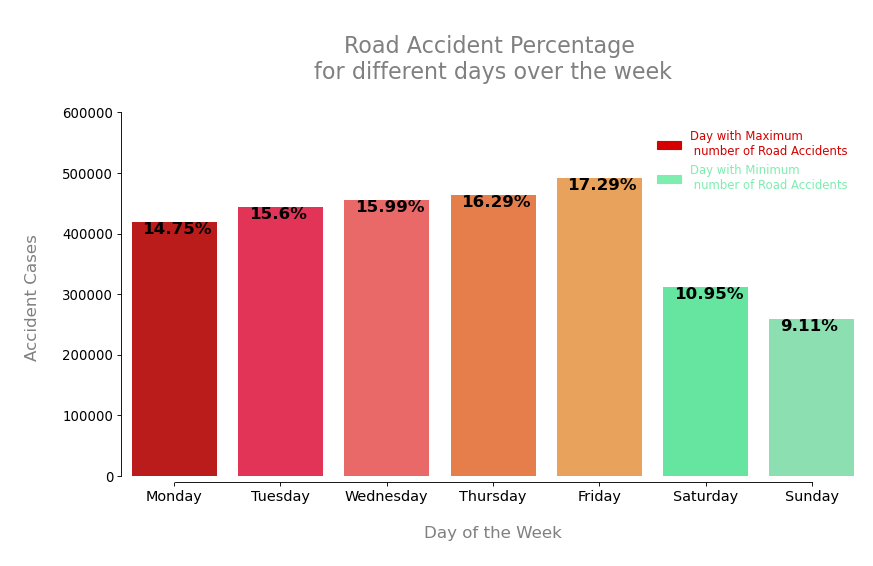

In [54]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define day order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Convert Day column to categorical variable with day_order as the ordering
day_acs['Day'] = pd.Categorical(day_acs['Day'], categories=day_order, ordered=True)

# Create plot
fig, ax = plt.subplots(figsize=(12,6), dpi=80)
sns.barplot(y=day_acs['Cases'], x=day_acs['Day'], palette=['#D50000', '#FF1744', '#FF5252', '#ff7530', '#ffa245', '#50fa9d', '#7eedb0'])

total = acs.shape[0]
for i in ax.patches:
    ax.text(i.get_x()+0.1, i.get_height()-20000, \
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=15,weight='bold',
                color='black')

plt.ylim(-10000, 600000)
plt.title('\nRoad Accident Percentage \nfor different days over the week\n', size=20, color='grey')
plt.ylabel('\nAccident Cases\n', fontsize=15, color='grey')
plt.xlabel('\nDay of the Week\n', fontsize=15, color='grey')
plt.xticks(fontsize=13)
plt.yticks(fontsize=12)

for i in ['top', 'right']:
    side = ax.spines[i]
    side.set_visible(False)
    
ax.set_axisbelow(True)
ax.spines['bottom'].set_bounds(0.005, 6)
ax.spines['left'].set_bounds(0, 600000)

MA = mpl.patches.Patch(color='#D50000', label='Day with Maximum\n number of Road Accidents')
MI = mpl.patches.Patch(color='#7eedb0', label='Day with Minimum\n number of Road Accidents')

ax.legend(handles=[MA, MI], prop={'size': 10.5}, loc='best', borderpad=1, edgecolor='white', labelcolor=['#D50000', '#7eedb0']);

plt.show()


#### Analysis of the Daily Road Accident

1) From Monday to Friday, There are more accidents occuring within the weekdays in comparison to the weekends

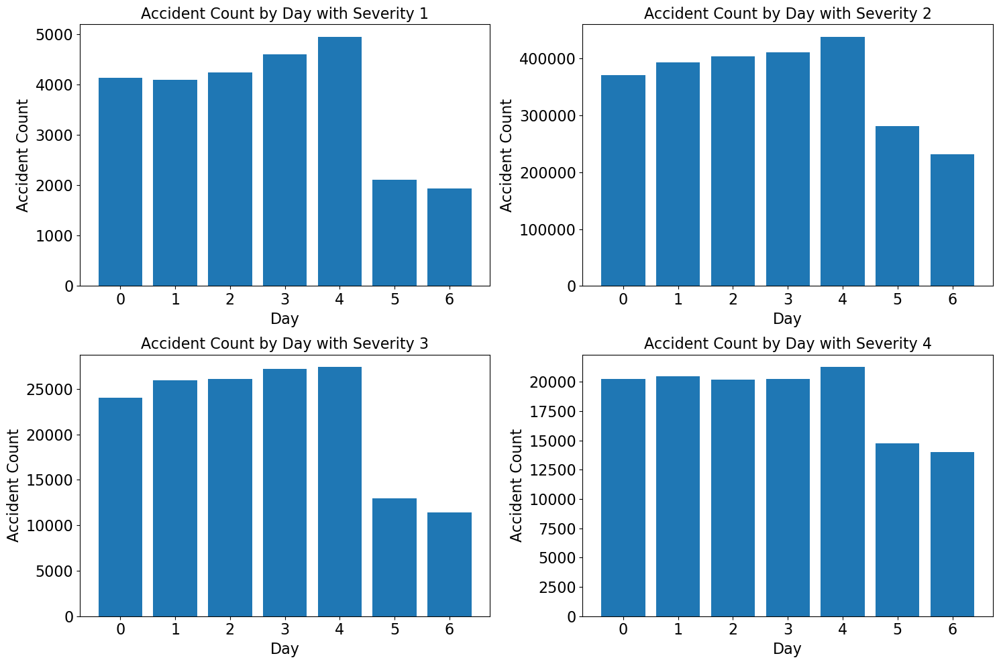

In [55]:
acs['DayOfWeek'] = acs['time'].dt.dayofweek
plt.subplots(2,2,figsize=(15,10))
for s in np.arange(1,5):
    plt.subplot(2,2,s)
    plt.hist(acs.loc[acs["Severity"] == s]['DayOfWeek'], bins=[0,1,2,3,4,5,6,7], align='left', rwidth=0.8)
    plt.title("Accident Count by Day with Severity " + str(s), fontsize=16)
    plt.xlabel("Day", fontsize=16)
    plt.ylabel("Accident Count", fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
plt.tight_layout()
plt.show()

### Analysis of the Hourly Road Accident

In [56]:
hour_acs = pd.DataFrame(acs.Start_Time.dt.hour.value_counts()).reset_index().rename(columns={'index':'Hours', 'Start_Time':'Cases'}).sort_values('Hours')

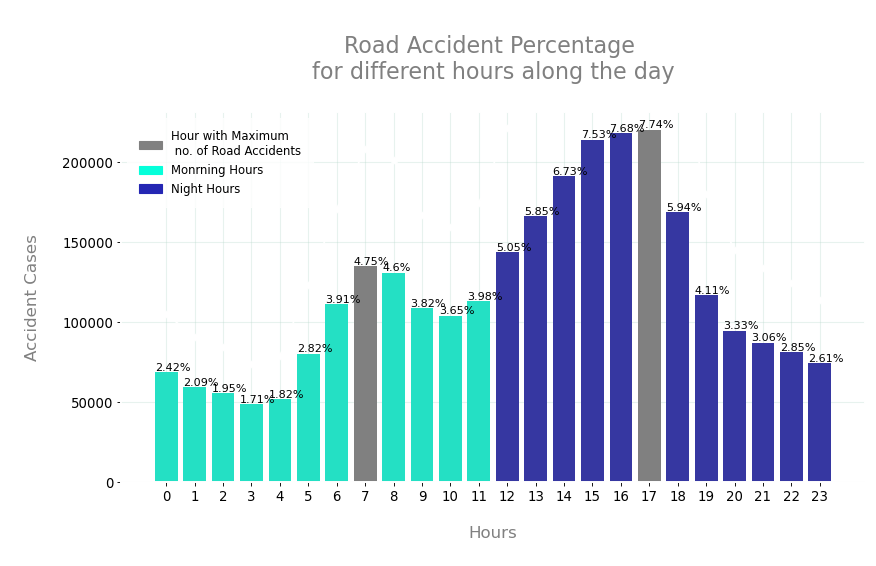

In [57]:
fig, ax = plt.subplots(figsize = (12,6), dpi = 80)

clrs = []
for x in hour_acs['Cases']:
    if int(hour_acs[hour_acs['Cases']==x]['Hours']) <= 11:
        if (x == max(list(hour_acs['Cases'])[:12])):
            clrs.append('grey')
        else:
            clrs.append('#05ffda')
    else:
        if (x == max(list(hour_acs['Cases'])[12:])):
            clrs.append('grey')
        else:
            clrs.append('#2426b3')
ax=sns.barplot(y=hour_acs['Cases'], x=hour_acs['Hours'], palette=clrs)
ax1 = ax.twinx()

sns.lineplot(data = hour_acs, marker='o', x='Hours', y='Cases', color = 'white', alpha = 1)

total = acs.shape[0]
for i in ax.patches:
    ax.text(i.get_x(), i.get_height()+1000, \
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=10,
                color='black')

plt.ylim(1000, 150000)
plt.title('\nRoad Accident Percentage \nfor different hours along the day\n', size=20, color='grey')

ax1.axes.yaxis.set_visible(False)
ax.set_xlabel('\nHours\n', fontsize=15, color='grey')
ax.set_ylabel('\nAccident Cases\n', fontsize=15, color='grey')

for i in ['bottom', 'top', 'left', 'right']:
    ax.spines[i].set_color('white')
    ax.spines[i].set_linewidth(1.5)
    ax1.spines[i].set_color('white')
    ax1.spines[i].set_linewidth(1.5)
    
ax.set_axisbelow(True)
ax.grid(color='#b2d6c7', linewidth=1, alpha=.3)
ax.tick_params(axis='both', which='major', labelsize=12)

MA = mpl.patches.Patch(color='grey', label='Hour with Maximum\n no. of Road Accidents')
MO = mpl.patches.Patch(color='#05ffda', label='Monrning Hours')
NI = mpl.patches.Patch(color='#2426b3', label='Night Hours')

ax.legend(handles=[MA, MO, NI], prop={'size': 10.5}, loc='upper left', borderpad=1, edgecolor='white');


#### Analysis of the Hourly Road Accidents

1) The time of 17:00 has concurred the highest record of road accident, garnering a total of 7.74%.

2) The time of 7:00 has concurred the second highest of record accident, garnering a total of 4.75%.

### Additional Information of Hourly Analysis of Road Accident

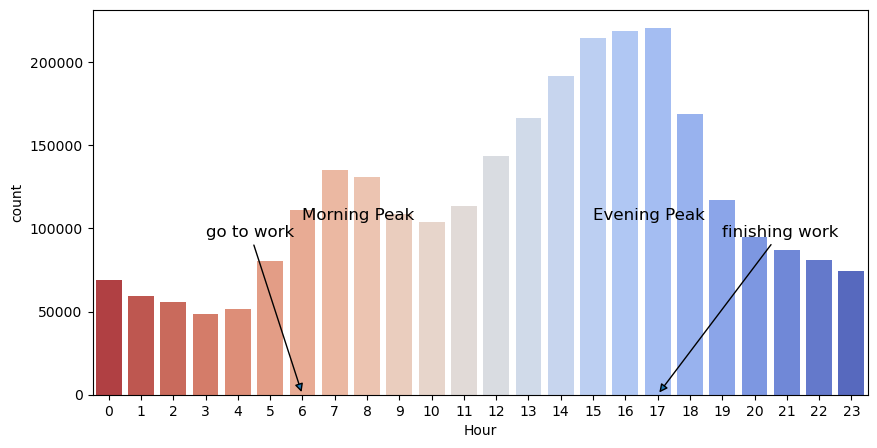

In [58]:
fig, ax = plt.subplots(figsize = (10,5))
sns.countplot(x="Hour", data = acs, orient = 'v', palette = "coolwarm_r")
plt.annotate('Morning Peak',xy=(6,105000), fontsize=12)
plt.annotate('Evening Peak',xy=(15,105000), fontsize=12)
plt.annotate('go to work',xy=(6,0),xytext=(3,95000),arrowprops={'arrowstyle':'-|>'}, fontsize=12)
plt.annotate('finishing work',xy=(17,0),xytext=(19,95000),arrowprops={'arrowstyle':'-|>'}, fontsize=12)
plt.show()

#### Hourly Analysis of Road Accident

1) The highest record of road accident hourly correlates in regard to people finishing work

2) The second highest record of road accident hourly correlates in regard to people going to work

C:\Users\User\AppData\Local\Temp\ipykernel_2672\4113861591.py:29: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



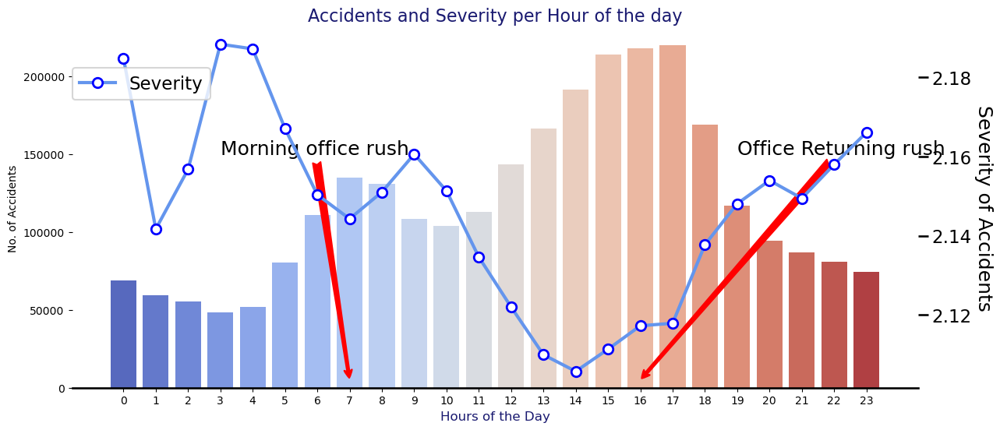

In [59]:
hour_severity = acs[['Hour' , 'Severity']].groupby('Hour').agg({'Hour' : 'count' , 'Severity' : 'mean'})

fig, ax = plt.subplots(1,1,figsize = (14,6))

sns.set_context('talk')

f = sns.barplot(x=hour_severity['Hour'].index , y=hour_severity['Hour'], ax = ax, palette='coolwarm')

ax2 = ax.twinx()

ax2.plot(hour_severity['Severity'] , color='CornFlowerBlue', label='Severity',linewidth=3,
           linestyle='solid',marker='.',markersize=18, markerfacecolor='w',markeredgecolor='b',markeredgewidth='2')

sns.despine(left=True)

ax2.spines[('top')].set_visible(False)
ax2.spines[('right')].set_visible(False)
ax2.spines[('left')].set_visible(False)
ax.set_xlabel("Hours of the Day", fontdict = {'fontsize':12 , 'color':'MidnightBlue'} )
ax.set_ylabel("No. of Accidents")
ax2.set_ylabel("Severity of Accidents", rotation=270 ,labelpad=20)
ax.set_title('Accidents and Severity per Hour of the day', fontdict = {'fontsize':16 , 'color':'MidnightBlue'})

ax2.legend(loc=(0,0.8))

ax.annotate('Morning office rush' , xytext=(3,150000) , xy=(7,5000),arrowprops={'arrowstyle':'fancy' , 'color':'Red'})
ax.annotate('Office Returning rush' , xytext=(19,150000),xy=(16,5000),arrowprops={'arrowstyle':'fancy', 'color':'Red'})

fig.show()

## Period of the Day

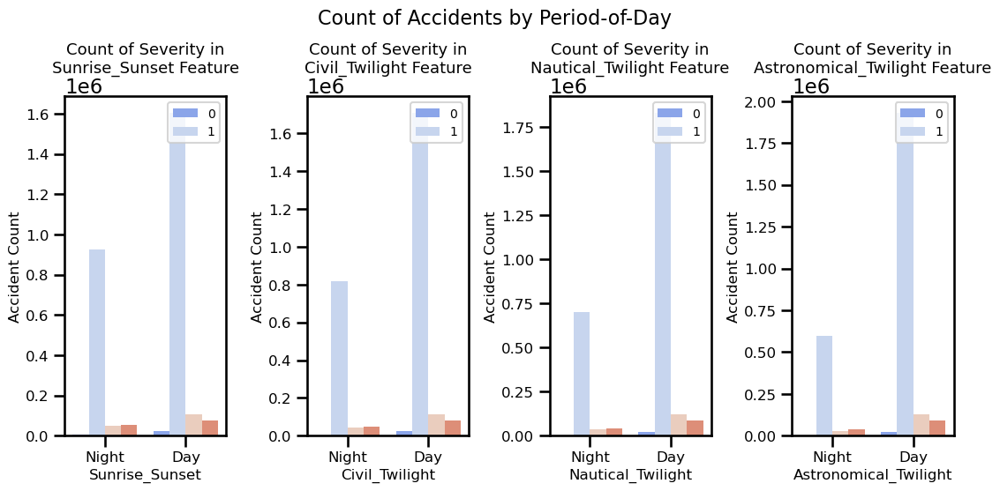

In [60]:
period_of_day = ['Sunrise_Sunset','Civil_Twilight','Nautical_Twilight','Astronomical_Twilight']
fig, axs = plt.subplots(ncols=1, nrows=4, figsize=(13, 5))

plt.subplots_adjust(wspace = 0.5)
for i, feature in enumerate(period_of_day, 1):    
    plt.subplot(1, 4, i)
    sns.countplot(x=feature, hue='Severity', data= acs ,palette="coolwarm")
    
    plt.xlabel('{}'.format(feature), size=12, labelpad=3)
    plt.ylabel('Accident Count', size=12, labelpad=3)    
    plt.tick_params(axis='x', labelsize=12)
    plt.tick_params(axis='y', labelsize=12)
    
    plt.legend(['0', '1'], loc='upper right', prop={'size': 10})
    plt.title('Count of Severity in\n{} Feature'.format(feature), size=13, y=1.05)
fig.suptitle('Count of Accidents by Period-of-Day',y=1.08, fontsize=16)
plt.show()

# Weather Attribute

## Analysis of the Weather Conditions

In [61]:
conditions_acs = pd.DataFrame(acs.Weather_Condition.value_counts().head(10)).reset_index().rename(columns={'index':'Weather_Condition', 'Weather_Condition':'Cases'})

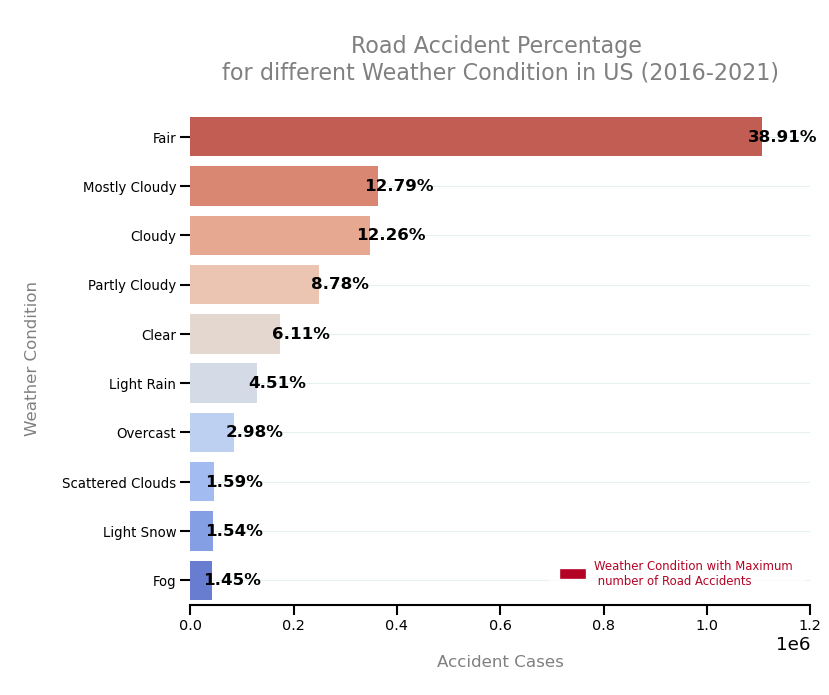

In [62]:
fig, ax = plt.subplots(figsize = (10,8), dpi = 80)

cmap = mpl.cm.get_cmap('coolwarm_r', 10)   
clrs = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]

ax=sns.barplot(x = conditions_acs['Cases'], y = conditions_acs['Weather_Condition'], palette='coolwarm_r')

total = acs.shape[0]
for p in ax.patches:
    plt.text(p.get_width()+40000, p.get_y()+0.4,
            '{:.2f}%'.format(p.get_width()*100/total),ha='center', va='center', fontsize=15, color='black', weight='bold')

plt.title('\nRoad Accident Percentage \nfor different Weather Condition in US (2016-2021)\n', size=20, color='grey')
plt.xlabel('\nAccident Cases\n', fontsize=15, color='grey')
plt.ylabel('\nWeather Condition\n', fontsize=15, color='grey')
plt.xticks(fontsize=13)
plt.yticks(fontsize=12)
plt.xlim(0, 1200000)

for i in ['top', 'left', 'right']:
    side = ax.spines[i]
    side.set_visible(False)

ax.set_axisbelow(True)
ax.spines['bottom'].set_bounds(0, 1200000)
ax.grid(color='#b2d6c7', linewidth=1, axis='y', alpha=.3)

MA = mpl.patches.Patch(color=clrs[0], label='Weather Condition with Maximum\n number of Road Accidents')
ax.legend(handles=[MA], prop={'size': 10.5}, loc='best', borderpad=1, 
          labelcolor=[clrs[0]], edgecolor='white');

#### Analysis of the Weather Conditions

1) Fair attained the highest case in the duration of the accident, garnering at 38.91%

2) Mostly Cloudy attained the second highest case in the duration of the accident, garnering at 12.79%

3) Cloudy attained the third highest case in the duration of the accident, garnering at 12.26% (similar to Mostly Cloudy)

### Most Frequent Conditions by Severity

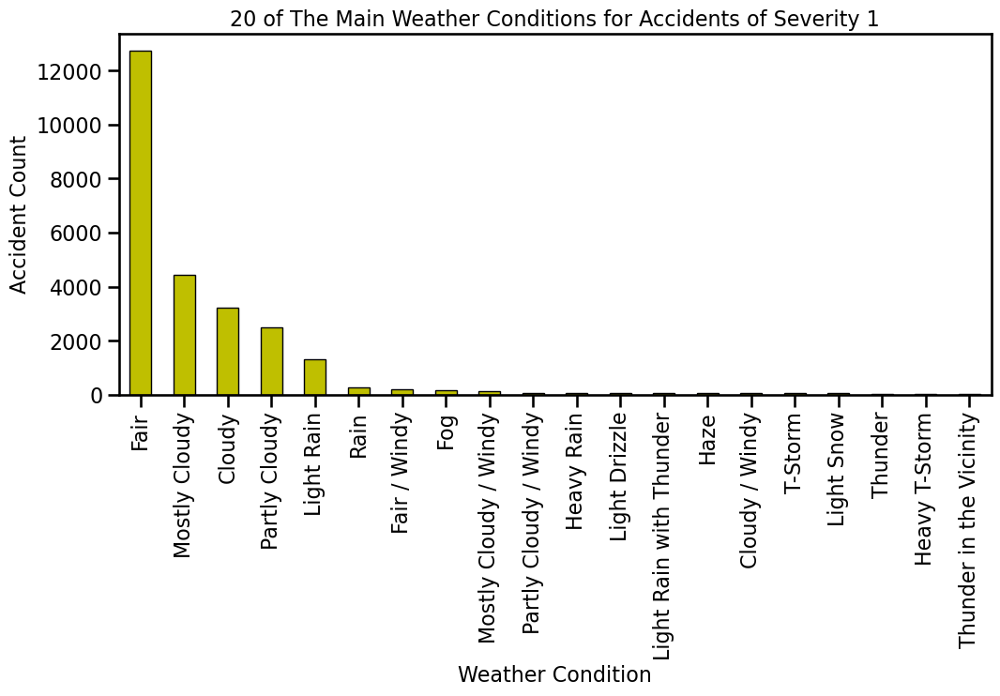

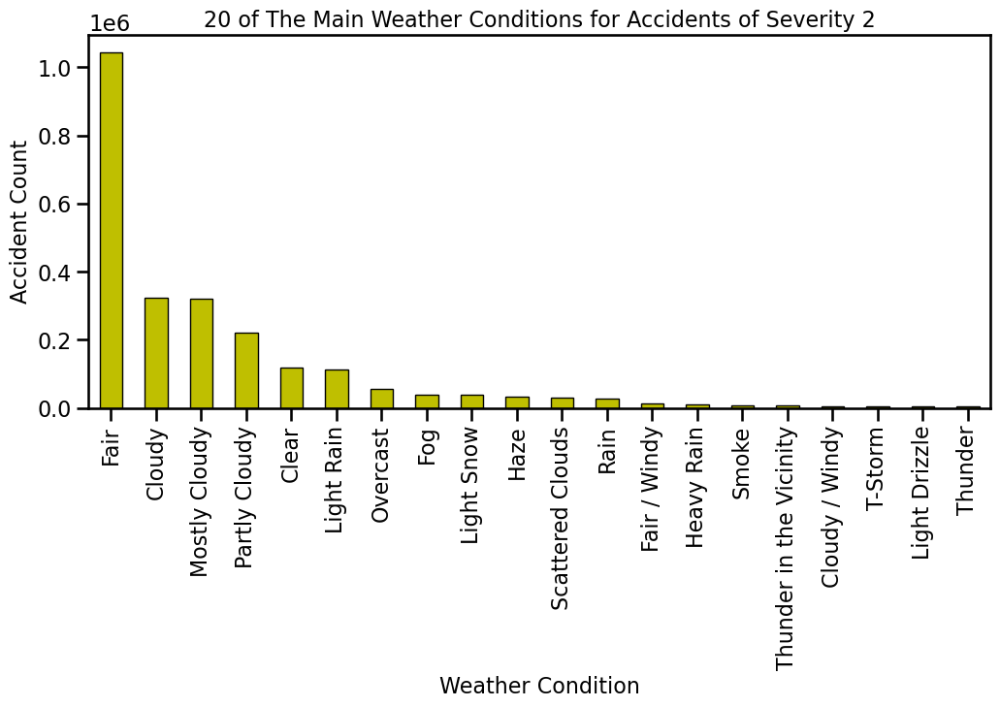

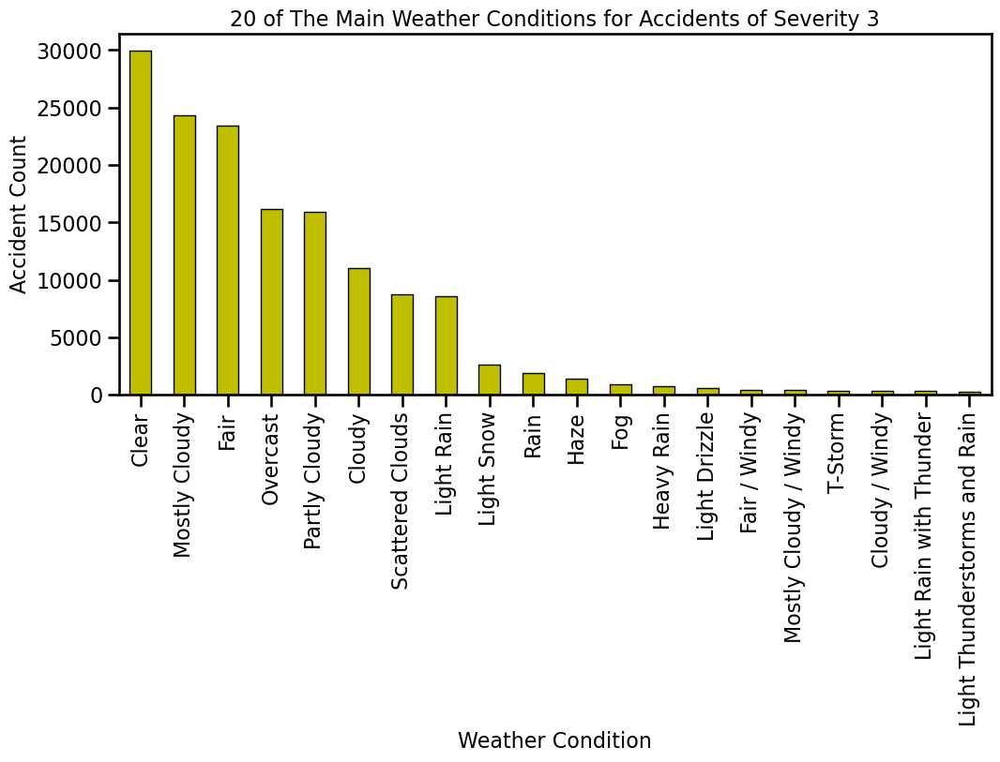

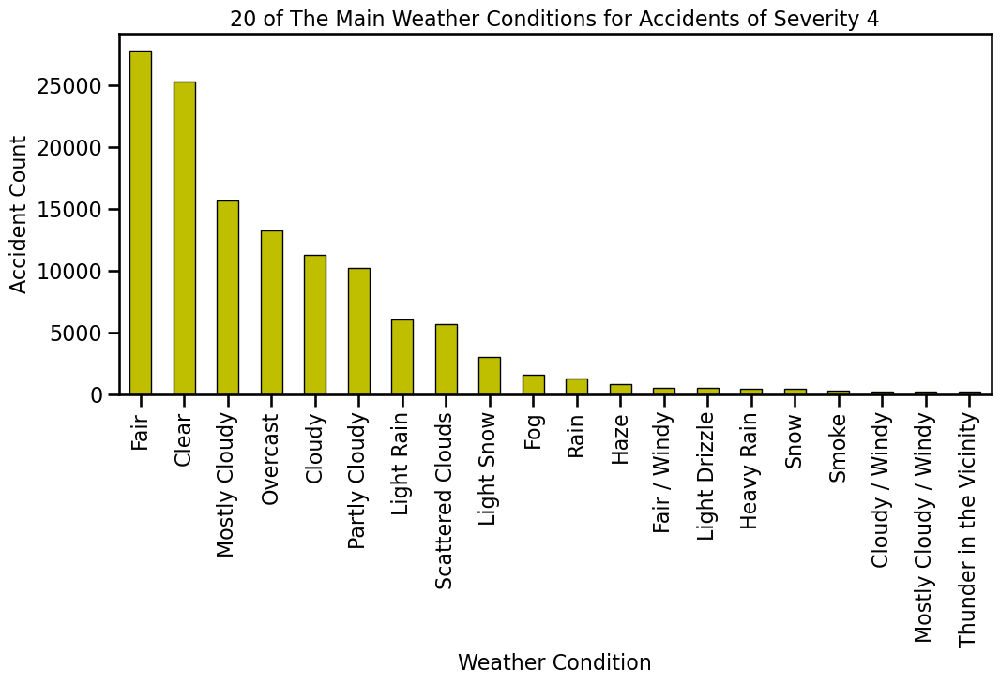

In [63]:
for s in np.arange(1,5):
    plt.subplots(figsize=(12,5))
    acs.loc[acs["Severity"] == s]['Weather_Condition'].value_counts().sort_values(ascending=False).head(20).plot.bar(width=0.5,color='y',edgecolor='k',align='center',linewidth=1)
    plt.xlabel('Weather Condition',fontsize=16)
    plt.ylabel('Accident Count',fontsize=16)
    plt.title('20 of The Main Weather Conditions for Accidents of Severity ' + str(s),fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)

### Weather Conditions by Severity

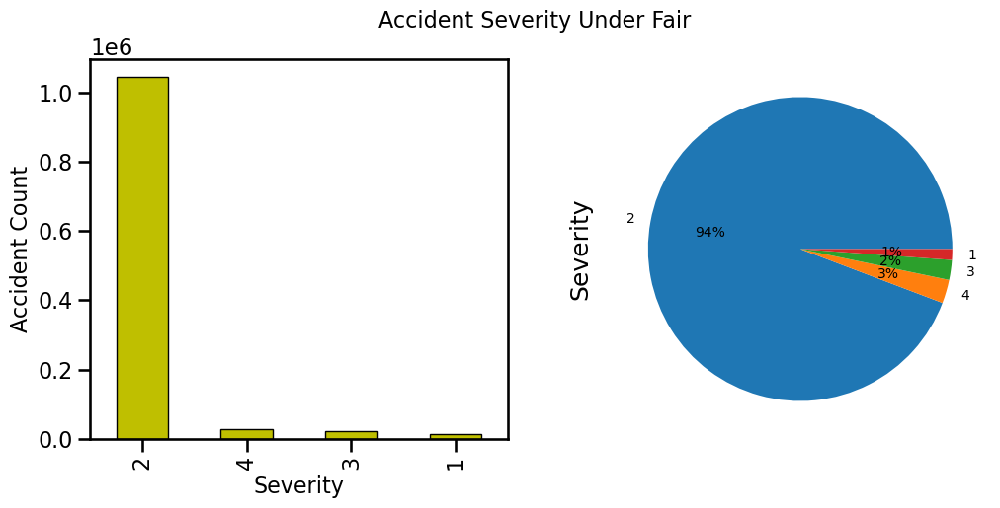

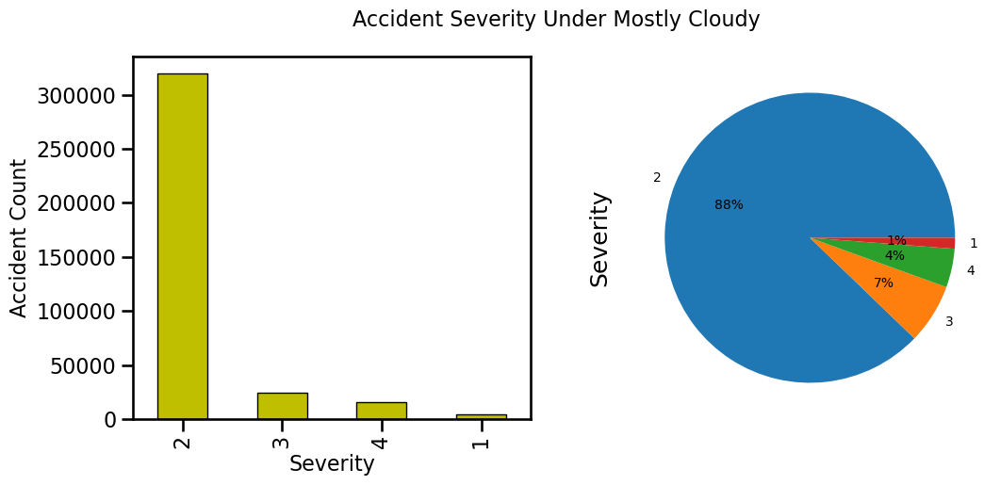

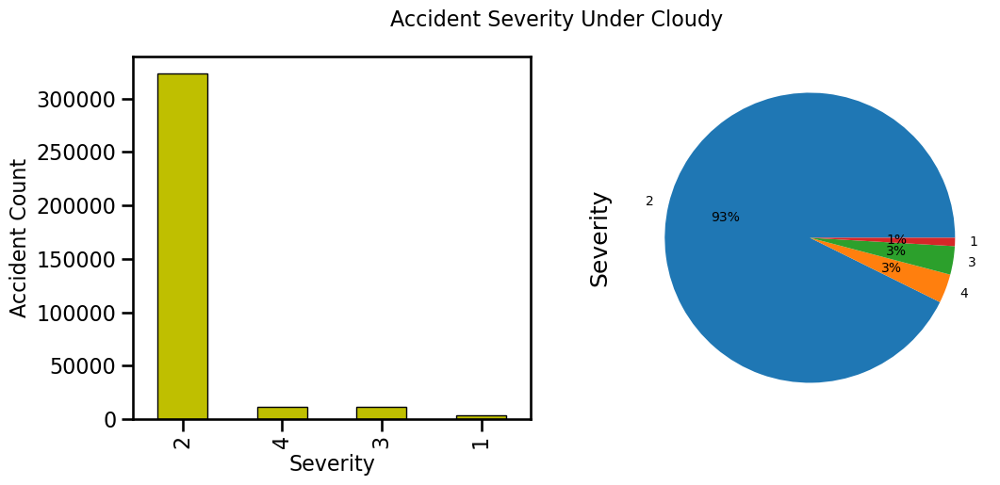

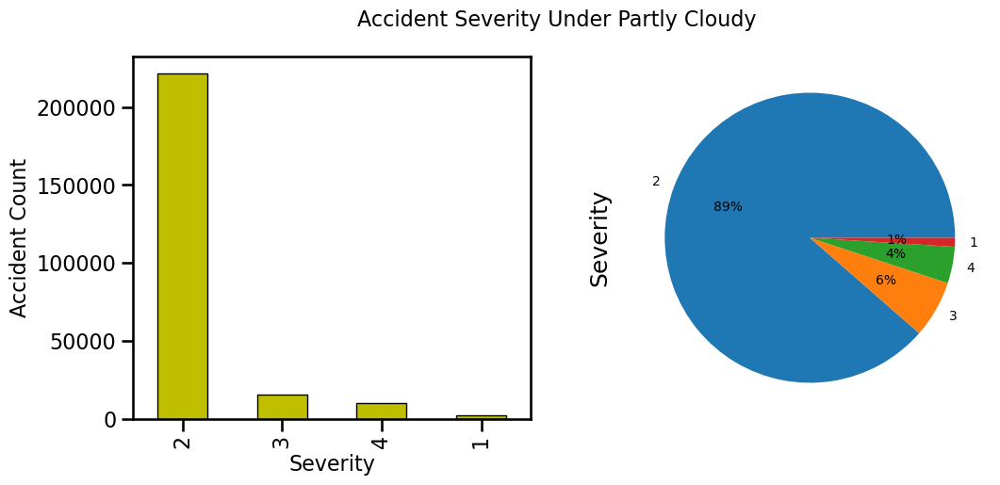

In [64]:
for s in ["Fair","Mostly Cloudy","Cloudy","Partly Cloudy"]:
    plt.subplots(1,2,figsize=(12,5))
    plt.suptitle('Accident Severity Under ' + s,fontsize=16)
    plt.subplot(1,2,1)
    acs.loc[acs["Weather_Condition"] == s]['Severity'].value_counts().plot.bar(width=0.5,color='y',edgecolor='k',align='center',linewidth=1)
    plt.xlabel('Severity',fontsize=16)
    plt.ylabel('Accident Count',fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.subplot(1,2,2)
    acs.loc[acs["Weather_Condition"] == s]['Severity'].value_counts().plot.pie(autopct='%1.0f%%', fontsize=10)

### Top 5 Weather Conditions

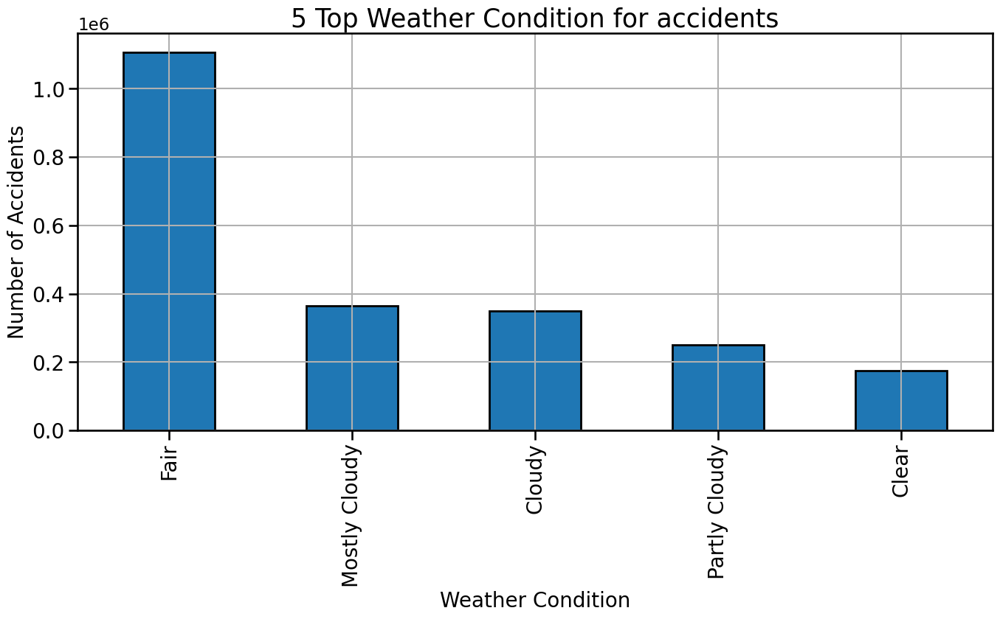

In [65]:
fig, ax=plt.subplots(figsize=(16,7))
acs['Weather_Condition'].value_counts().sort_values(ascending=False).head(5).plot.bar(width=0.5,edgecolor='k',align='center',linewidth=2)
plt.xlabel('Weather Condition',fontsize=20)
plt.ylabel('Number of Accidents',fontsize=20)
ax.tick_params(labelsize=20)
plt.title('5 Top Weather Condition for accidents',fontsize=25)
plt.grid()
plt.ioff()

### Additional Information of Weather Conditions

### Analysis of the Temperature

In [66]:
def weather_int_labels(attribute, split, gap):
    var_min = min(acs[attribute])
    intervals = [int(var_min)]
    labels = []
    for i in range(1, split+1):
        
        lower_limit = int(var_min+((i-1)*gap))
        
        if i==split:
            upper_limit = int(max(acs[attribute]))
        else:
            upper_limit = int(var_min + (i*gap))
            
        #intervals
        intervals.append(upper_limit)
        
        # labels
        label_var = '({} to {})'.format(lower_limit, upper_limit)
        labels.append(label_var)    
    
    return intervals, labels

In [67]:
def Feature_Plot(dataframe, attribute, clrs, intervals, labels, fig_size, font_size, y_lim, adjust, title):
    
    new_acs = dataframe.copy()
    xlabel = 'Different {} Grouped Value'.format(attribute)
    new_acs[xlabel] = pd.cut(x = new_acs[attribute], bins = intervals, labels = labels, include_lowest=True)
    temp_acs = pd.DataFrame(new_acs[xlabel].value_counts()).reset_index().rename(columns={'index':'Bins', xlabel:'Cases'}).sort_values('Bins')
    
    count,max_index = 0, 0
    cases_list = list(temp_acs['Cases'])
    for i in cases_list:
        if i == max(temp_acs['Cases']):
            max_index = count
            break
        count += 1
                                                                                               
    total = len(new_acs[xlabel])
    plt.figure(figsize=fig_size)
    
    cmap = mpl.cm.get_cmap(clrs, len(intervals))   
    clrs = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(cmap.N)]
    
    ax=sns.barplot(y=temp_acs['Cases'], x=temp_acs['Bins'], palette=clrs);
    
    for i in ax.patches:
        ax.text(i.get_x()+adjust[0], i.get_height()+adjust[-1], \
            '{:,d}\nCases\n({}%) '.format(int(i.get_height()), round(100*i.get_height()/total, 2)), fontsize=font_size,
                color='black')
        
    plt.title(title, size=20, color='grey')
    plt.ylim(y_lim)
    
    for i in ['bottom', 'top', 'left', 'right']:
        ax.spines[i].set_color('white')
        ax.spines[i].set_linewidth(1.5)
        
    ax.set_xlabel('\n{}\n'.format(xlabel), fontsize=15, color='grey')
    ax.set_ylabel('\nAccident Cases\n', fontsize=15, color='grey')
    
    ax.set_axisbelow(True)
    ax.grid(color='#b2d6c7', linewidth=1, alpha=.3)
    ax.tick_params(axis='both', which='major', labelsize=12)
    MA = mpl.patches.Patch(color=clrs[max_index], label='{} Range with Maximum\n no. of Road Accidents'.format(attribute))
    ax.legend(handles=[MA], prop={'size': 10.5}, loc='best', borderpad=1, 
              labelcolor=[clrs[max_index]], edgecolor='white');
    
    plt.show()

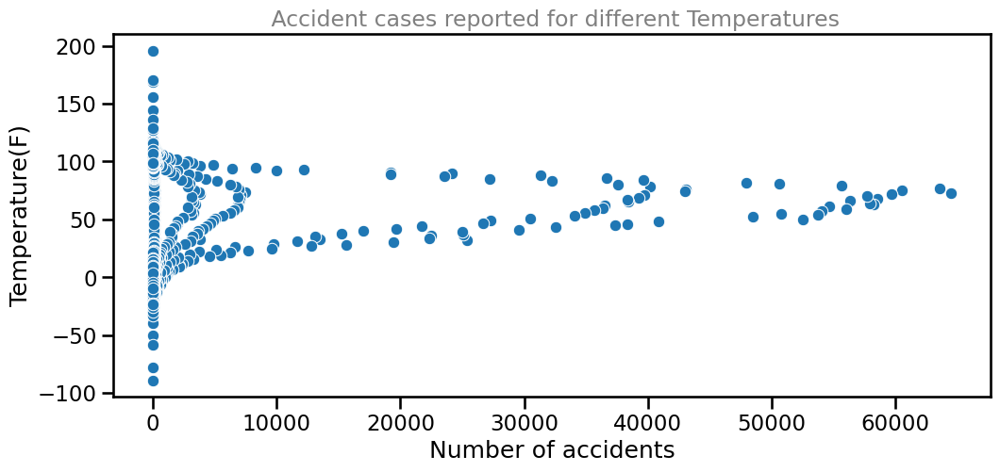

In [68]:
weather_condition = acs["Temperature(F)"].value_counts()

plt.figure(figsize=(12,5))
plt.title(" Accident cases reported for different Temperatures",size=17,color="grey")
plt.xlabel('Number of accidents')
plt.ylabel('Temperature(F)')
sns.scatterplot( y = weather_condition.index, x = weather_condition)
plt.show()

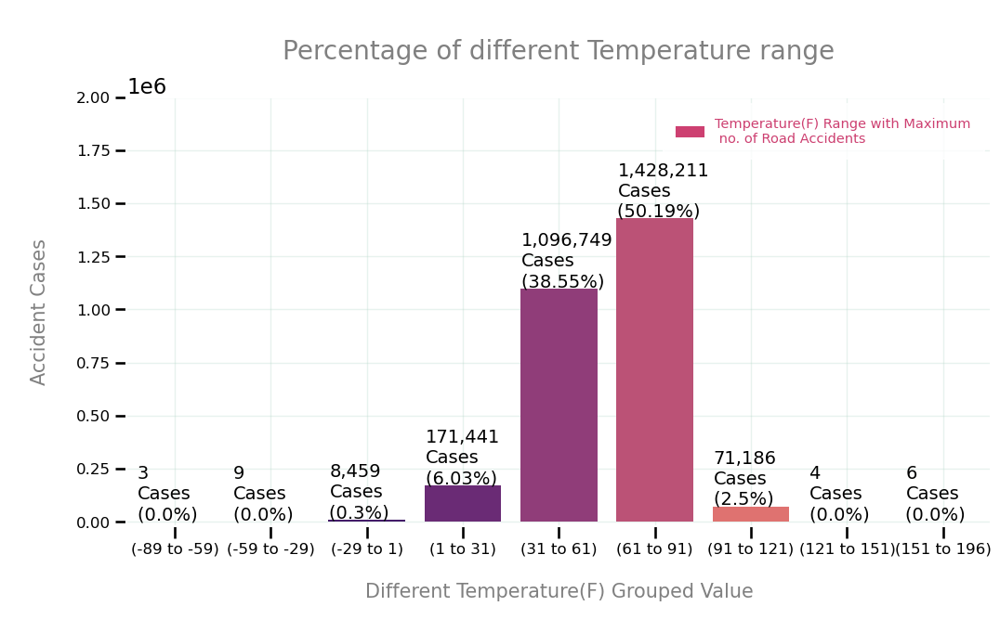

In [69]:
temp_intervals, temp_labels = weather_int_labels('Temperature(F)', 9, 30)

Feature_Plot(acs, 'Temperature(F)', 'magma',temp_intervals, temp_labels, 
                 (12, 6), 14, (-20000, 2000000), [0.01, 10000], '\nPercentage of different Temperature range\n')

#### Analysis of Temperature range

1) 61 to 91 farehnheit has procured the highest cases of road accident, garnering at 50.19% and 1,428,211 cases

2) 31 to 61  farehnheit has procured the second highest cases of road accident, garnering at 38.55% and 1,098,749 cases

### Analysis of the Humidity

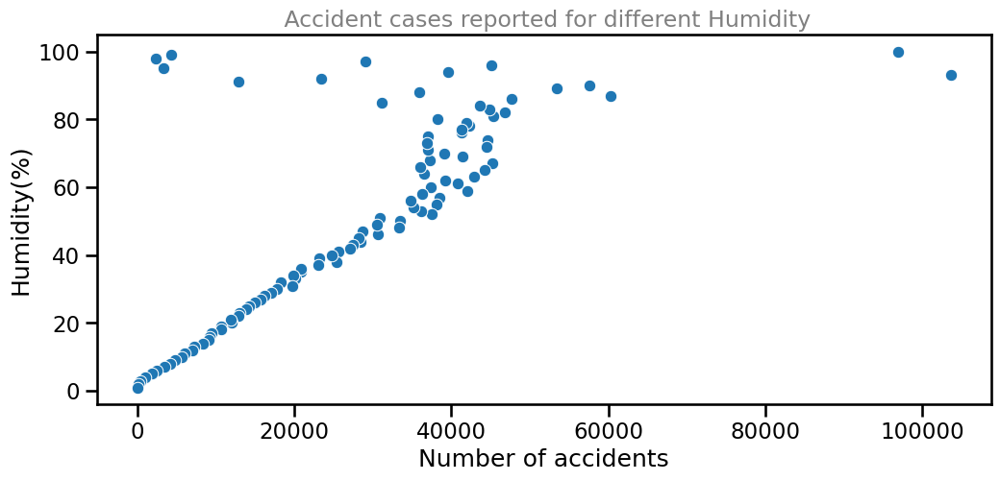

In [70]:
weather_condition1 = acs["Humidity(%)"].value_counts()

plt.figure(figsize=(12,5))
plt.title(" Accident cases reported for different Humidity",size=17,color="grey")
plt.xlabel('Number of accidents')
plt.ylabel('Humidity(%)')
sns.scatterplot( y = weather_condition1.index, x = weather_condition1)
plt.show()

#### Outlier is present

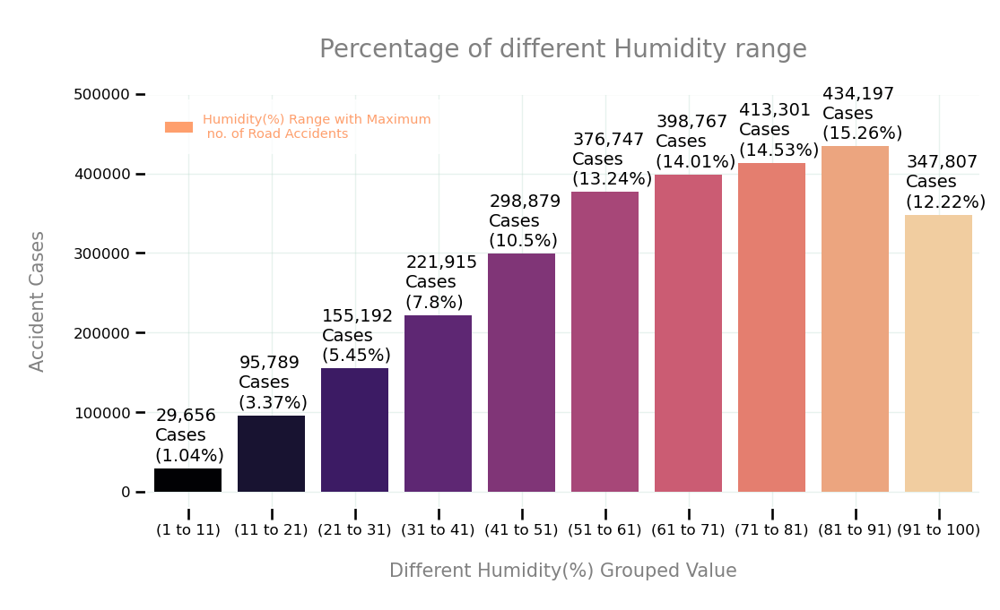

In [71]:
Humidity_intervals, Humidity_labels = weather_int_labels('Humidity(%)', 10, 10)

Feature_Plot(acs, 'Humidity(%)', 'magma', Humidity_intervals, Humidity_labels, 
                 (12, 6), 14, (-20000, 500000), [0.01, 10000], '\nPercentage of different Humidity range\n')

#### Analysis of the Humidity

1) 81% to 91% of humidity has procured the highest cases of road accident, garnering at 15.26% and 434,197 cases

2) 71% to 81% humidity has procured the second highest cases of road accident, garnering at 14.53% and 413,301 cases

### Analysis of the Air Pressure

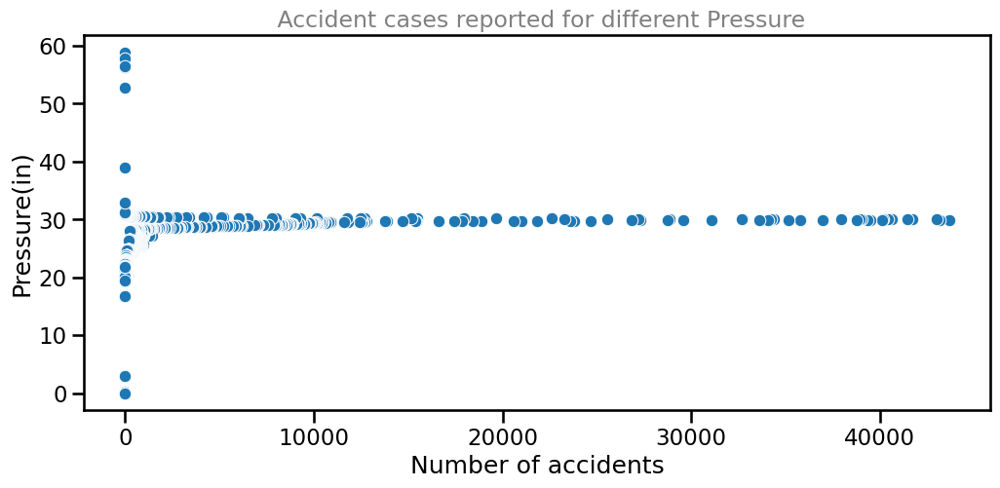

In [72]:
weather_condition2 = acs["Pressure(in)"].value_counts()

plt.figure(figsize=(12,5))
plt.title(" Accident cases reported for different Pressure",size=17,color="grey")
plt.xlabel('Number of accidents')
plt.ylabel('Pressure(in)')
sns.scatterplot( y = weather_condition2.index, x = weather_condition2)
plt.show()

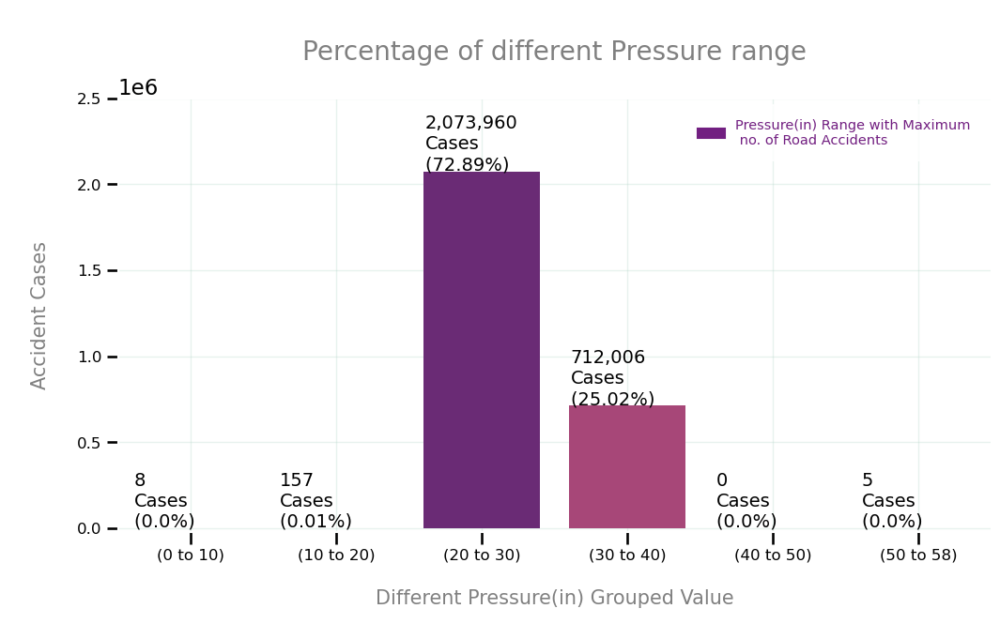

In [73]:
Pressure_intervals, Pressure_labels = weather_int_labels('Pressure(in)', 6, 10)

Feature_Plot(acs, 'Pressure(in)', 'magma', Pressure_intervals, Pressure_labels, 
                 (12, 6), 14, (-20000, 2500000), [0.01, 10000], '\nPercentage of different Pressure range\n')

#### Analysis of the Pressure(in)

1) Pressures between 20 to 30 (in) has procured the highest cases of road accident, garnering at 72.89% and 2,0734,960 cases

2) Pressures between 30 to 40 (in) has procured the highest cases of road accident, garnering at 25.02% and 712,006 cases

### Analysis of the Wind Speed

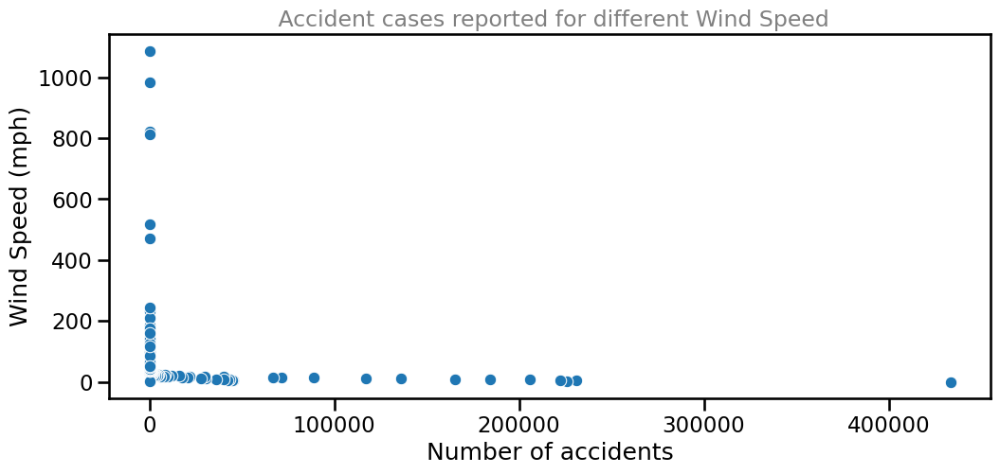

In [74]:
weather_condition3 = acs["Wind_Speed(mph)"].value_counts()

plt.figure(figsize=(12,5))
plt.title(" Accident cases reported for different Wind Speed",size=17,color="grey")
plt.xlabel('Number of accidents')
plt.ylabel('Wind Speed (mph)')
sns.scatterplot( y = weather_condition3.index, x = weather_condition3)
plt.show()

#### Outlier is present

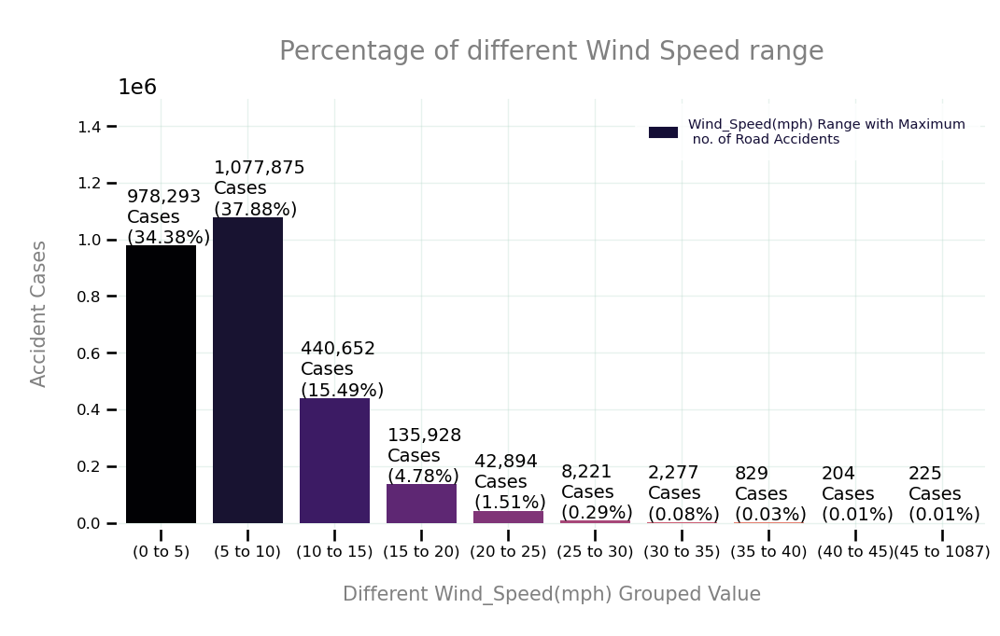

In [75]:
Wind_Speed_intervals, Wind_Speed_labels = weather_int_labels('Wind_Speed(mph)', 10, 5)

Feature_Plot(acs, 'Wind_Speed(mph)', 'magma',Wind_Speed_intervals, Wind_Speed_labels, 
                 (12, 6), 14, (-20000, 1500000), [0.01, 10000], '\nPercentage of different Wind Speed range\n')

#### Analysis of the Wind Speed

1) Wind speed between 5 to 10 (mph) has procured the highest cases of road accident, garnering at 37.88% and 1,077,875 cases

2) Wind speed between 0 to 5 (mph) has procured the highest cases of road accident, garnering at 34.38% and 978,293 cases

### Analysis of the Wind Chill 

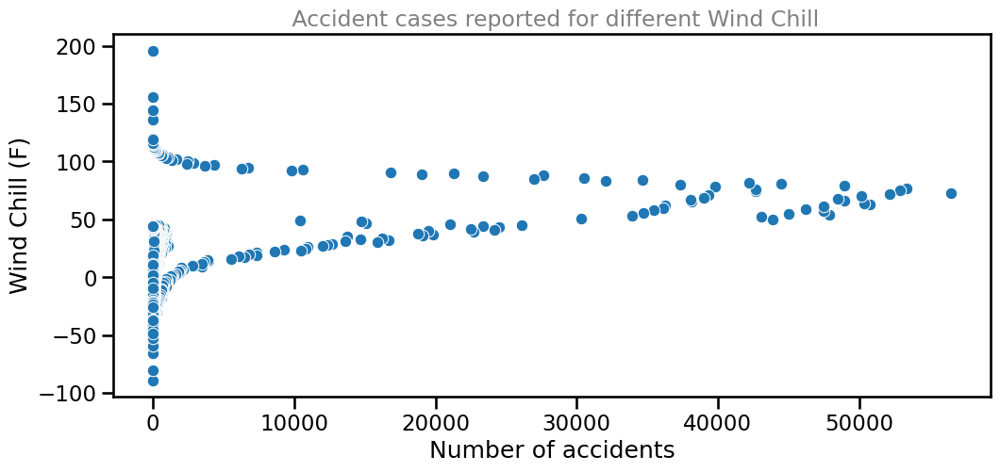

In [76]:
weather_condition4 = acs["Wind_Chill(F)"].value_counts()

plt.figure(figsize=(12,5))
plt.title(" Accident cases reported for different Wind Chill",size=17,color="grey")
plt.xlabel('Number of accidents')
plt.ylabel('Wind Chill (F)')
sns.scatterplot( y = weather_condition4.index, x = weather_condition4)
plt.show()

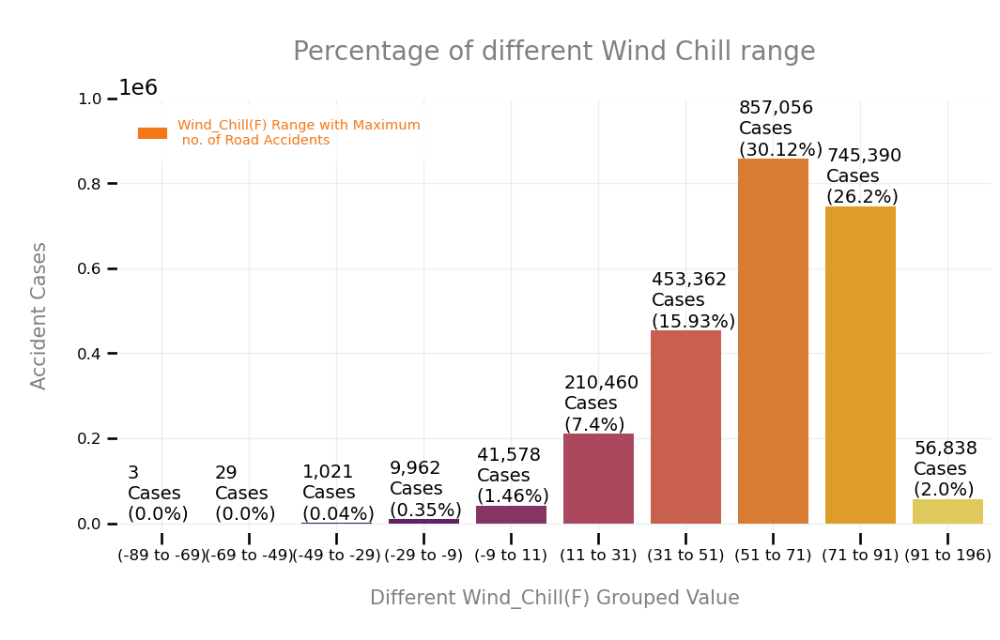

In [77]:
Wind_Chill_intervals, Wind_Chill_labels = weather_int_labels('Wind_Chill(F)', 10, 20)

Feature_Plot(acs, 'Wind_Chill(F)', 'inferno', Wind_Chill_intervals, Wind_Chill_labels, 
                 (12, 6), 14, (-20000, 1000000), [0.01, 10000], '\nPercentage of different Wind Chill range\n')

#### Analysis of the Wind Chill

1) Wind chill between 51 to 71 (F) has procured the highest cases of road accident, garnering at 30.12% and 857,056 cases

2) Wind chill between 71 to 91 (F) has procured the highest cases of road accident, garnering at 26.20% and 743,390 cases

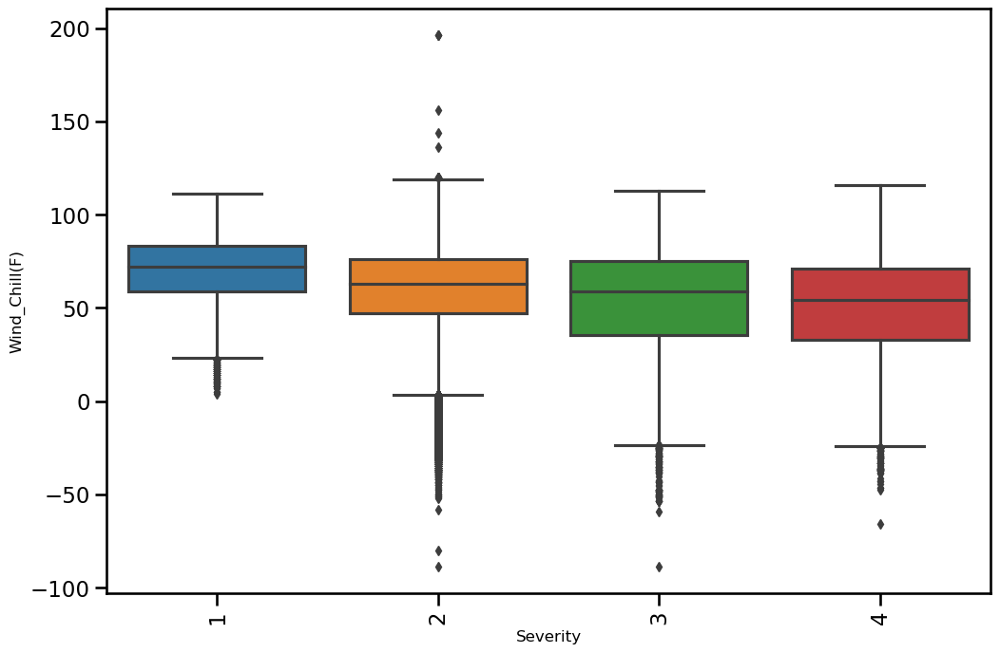

In [78]:
plt.figure(figsize=(12,8))
sns.boxplot(x="Severity", y="Wind_Chill(F)", data=acs)
plt.ylabel('Wind_Chill(F)', fontsize=12)
plt.xlabel('Severity', fontsize=12)
plt.xticks(rotation='vertical')
plt.show()

### Analysis of the Visibility

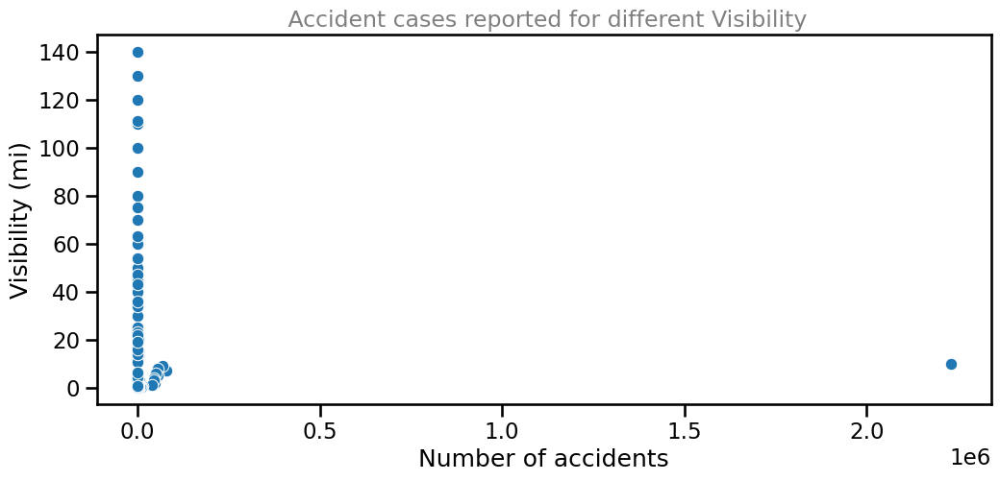

In [79]:
weather_condition5 = acs["Visibility(mi)"].value_counts()

plt.figure(figsize=(12,5))
plt.title(" Accident cases reported for different Visibility",size=17,color="grey")
plt.xlabel('Number of accidents')
plt.ylabel('Visibility (mi)')
sns.scatterplot( y = weather_condition5.index, x = weather_condition5)
plt.show()

#### Outlier is present

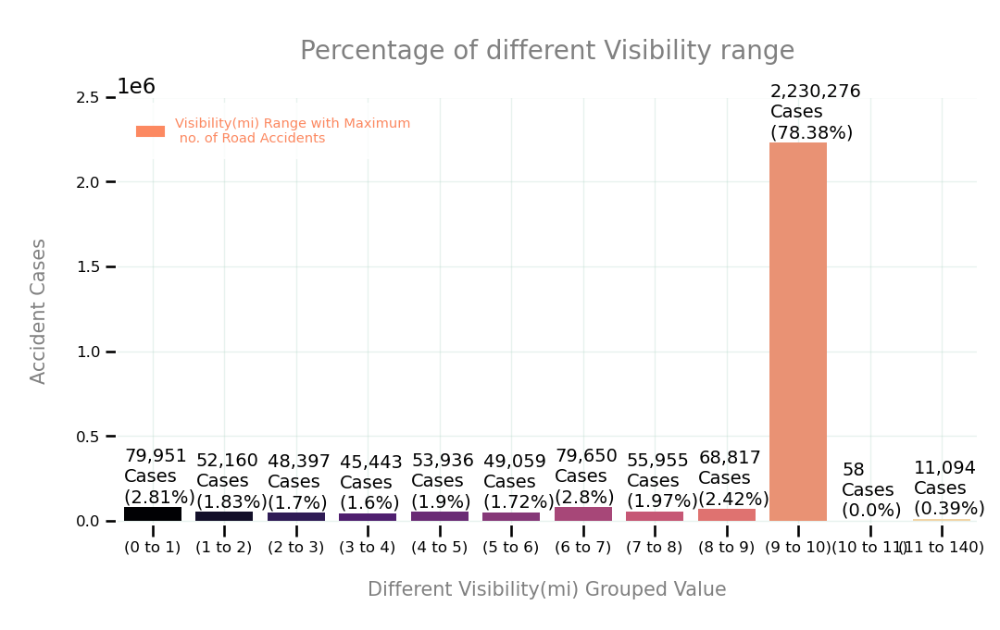

In [80]:
Visibility_intervals, Visibility_labels = weather_int_labels('Visibility(mi)', 12, 1)

Feature_Plot(acs, 'Visibility(mi)', 'magma', Visibility_intervals, Visibility_labels, 
                 (12, 6), 14, (-20000, 2500000), [0.01, 30000], '\nPercentage of different Visibility range\n')

#### Analysis of the Visibility

1) Visbility between 9 to 10 (mi) has procured the highest cases of road accident, garnering at 78.38% and 2,230,276 cases


### Analysis of the Percipitation (in)

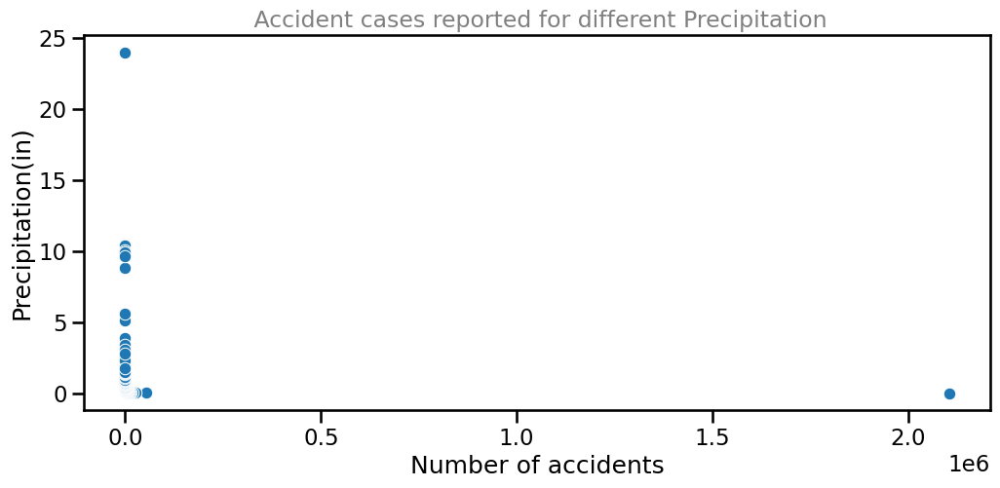

In [81]:
weather_condition6 = acs["Precipitation(in)"].value_counts()

plt.figure(figsize=(12,5))
plt.title(" Accident cases reported for different Precipitation",size=17,color="grey")
plt.xlabel('Number of accidents')
plt.ylabel('Precipitation(in)')
sns.scatterplot( y = weather_condition6.index, x = weather_condition6)
plt.show()

#### Outlier is present

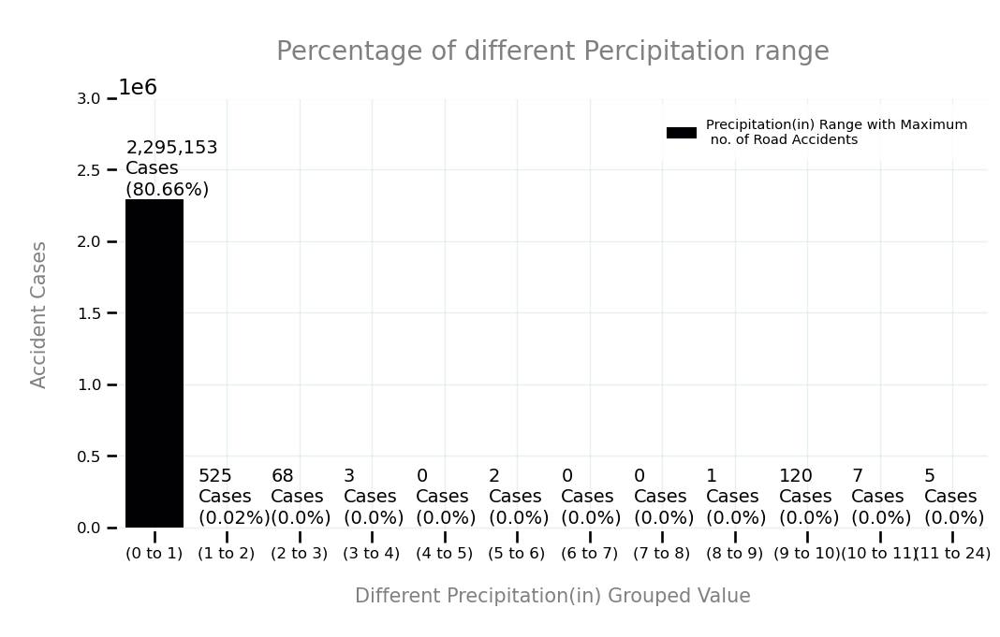

In [82]:
Precipitation_intervals, Precipitation_labels = weather_int_labels ('Precipitation(in)', 12, 1)

Feature_Plot(acs, 'Precipitation(in)', 'magma', Precipitation_intervals, Precipitation_labels, 
                 (12, 6), 14, (-20000, 3000000), [0.01, 30000], '\nPercentage of different Percipitation range\n')

#### Analysis of the Precipitation

1) Precipitation between 9 to 10 (in) has procured the highest cases of road accident, garnering at 80.66% and 2,295,153 cases


###  Weather Conditions

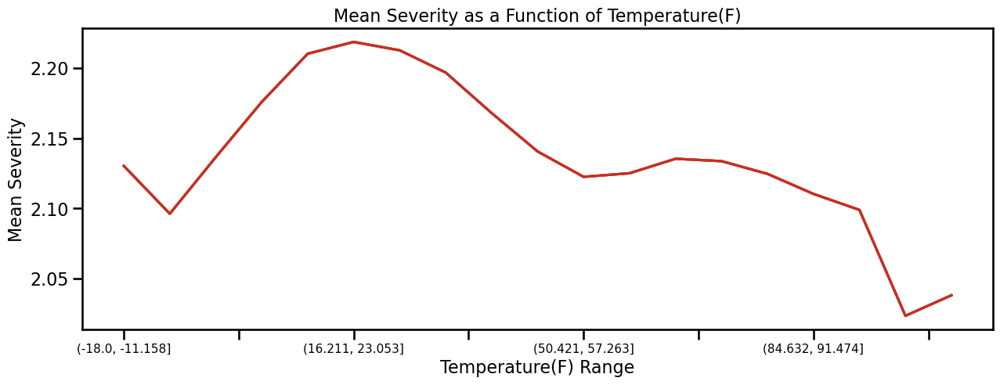

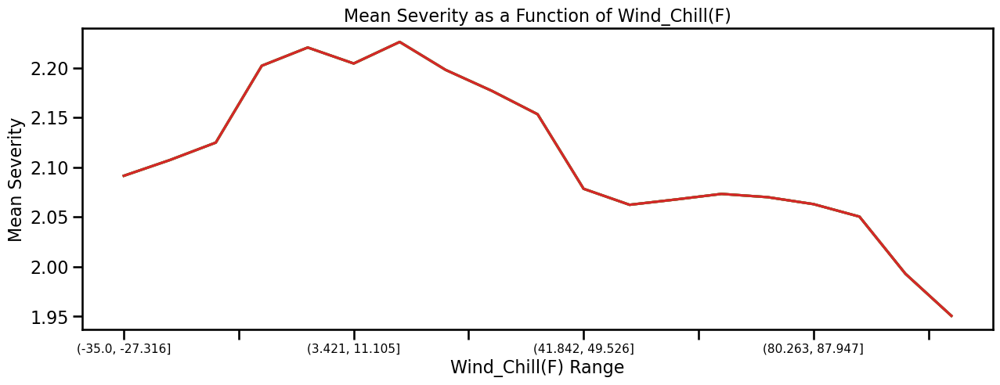

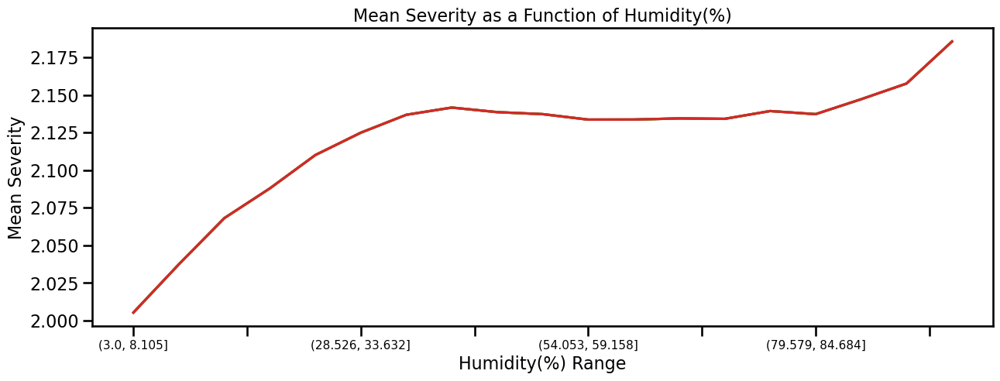

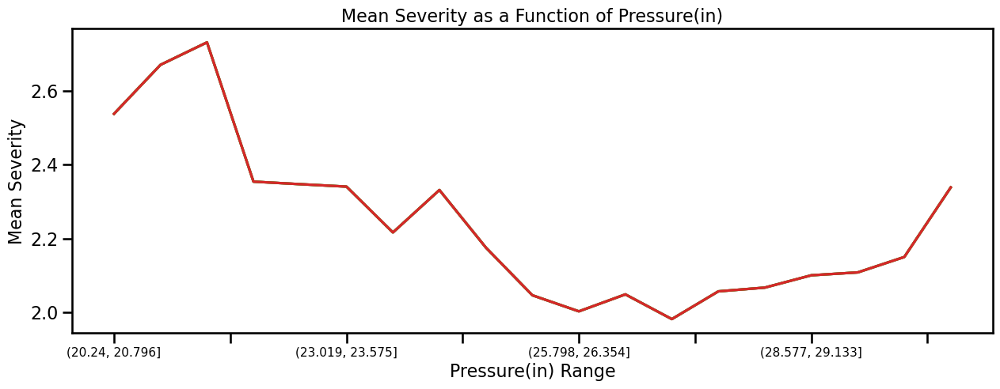

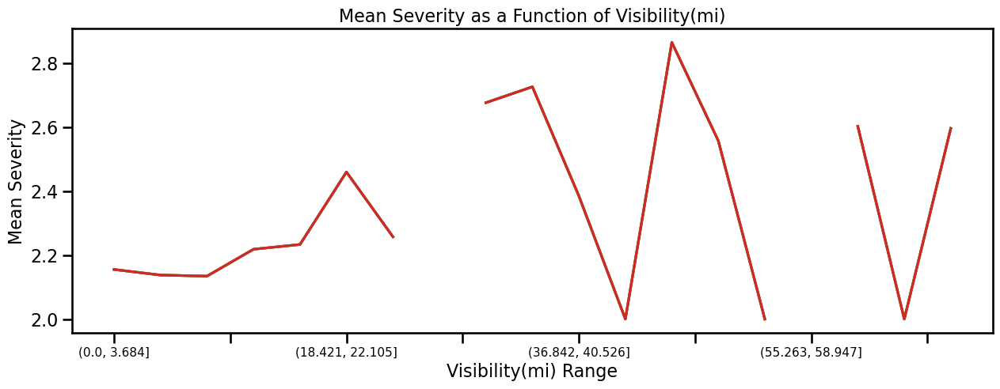

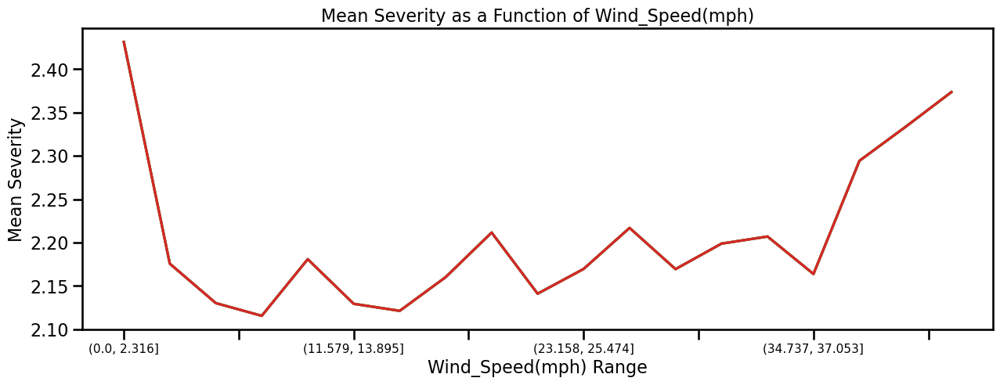

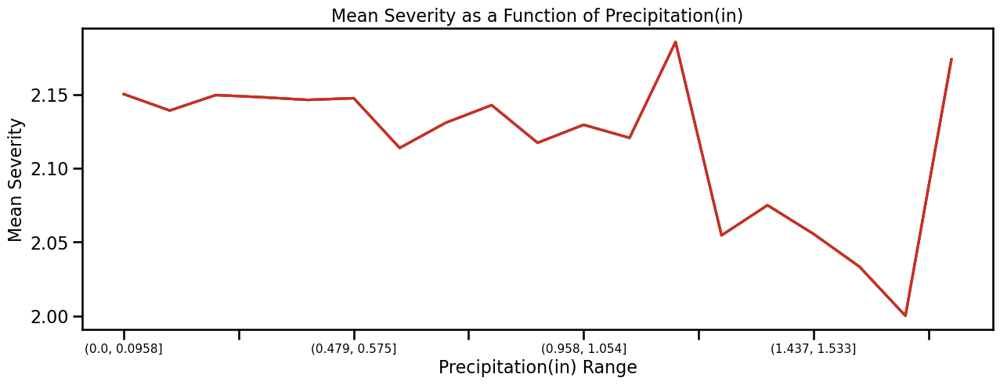

In [83]:
factors = ['Temperature(F)','Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)']

for factor in factors:
    # remove some of the extreme values
    factorMin = acs[factor].quantile(q=0.0001)
    factorMax = acs[factor].quantile(q=0.9999)

    plt.subplots(figsize=(15,5))
    for s in np.arange(1,5):
        acs["Severity"].groupby(pd.cut(acs[factor], np.linspace(factorMin,factorMax,num=20))).mean().plot()
        plt.title("Mean Severity as a Function of " + factor, fontsize=16)
        plt.xlabel(factor + " Range", fontsize=16)
        plt.ylabel("Mean Severity", fontsize=16)
        plt.xticks(fontsize=11)
        plt.yticks(fontsize=16)
        
plt.show()

# POI Attribute

## Severity

In [84]:
severity_2_mean = acs[acs['Severity'] == 2][['Severity','Year']].groupby('Year').count().mean()
severity_2_mean[0]

422165.1666666667

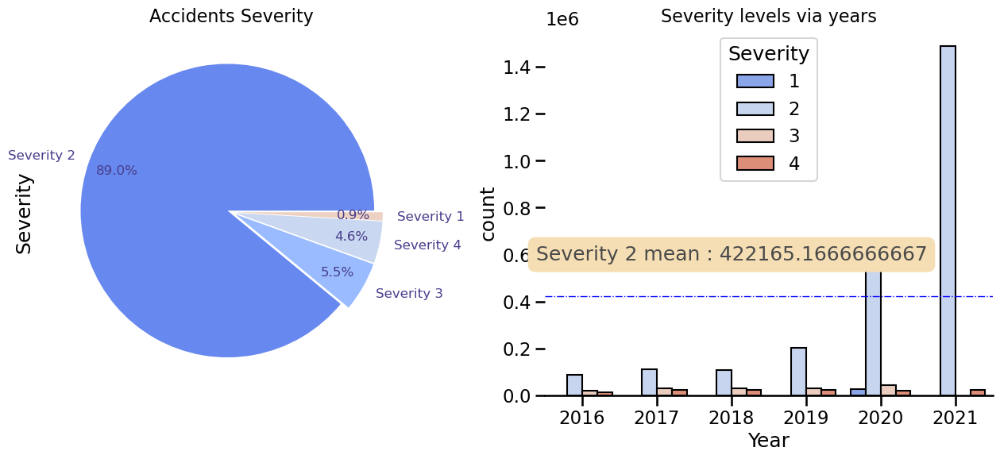

In [85]:
f , (ax1,ax2) = plt.subplots(1,2,figsize=(16,6))

acs['Severity'].value_counts().plot.pie(autopct = '%1.1f%%' , ax=ax1, colors =sns.color_palette(palette='coolwarm') ,
                                      pctdistance = 0.8, explode = [.03,.03,.03,.03], 
                                       textprops = {'fontsize' : 12 , 'color' : 'DarkSlateBlue'},
                                       labels=['Severity 2','Severity 3' , 'Severity 4' , 'Severity 1']
                              )

ax1.set_title("Accidents Severity", fontdict = {'fontsize':16 , 'color':'Black'} )


s = sns.countplot(data=acs[['Severity','Year']] , x = 'Year' , hue='Severity' , ax=ax2, palette = 'coolwarm' 
                  , edgecolor='black')
ax2.axhline(severity_2_mean[0] ,color='Blue', linewidth=1, linestyle='dashdot')
ax2.annotate(f"Severity 2 mean : {severity_2_mean[0]}",
            va = 'center', ha='center',
            color='#4a4a4a',
            bbox=dict(boxstyle='round', pad=0.4, facecolor='Wheat', linewidth=0),
            xy=(2,600000))

ax2.set_title("Severity levels via years", fontdict = {'fontsize':16 , 'color':'Black'} )

sns.despine(left=True)

plt.show()


#### Analysis of Severity

#### The Severity 2 mean is 422, 165

1) Severity 2 acquired 89.0% distrubution of the road accident

2) Severity 3 acquired 5.5% distrubution of the road accident

3) Severity 4 acquired 4.6% distrubution of the road accident

4) Severity 1 acquired 0.9% distrubution of the road accident

### Degree of Severity

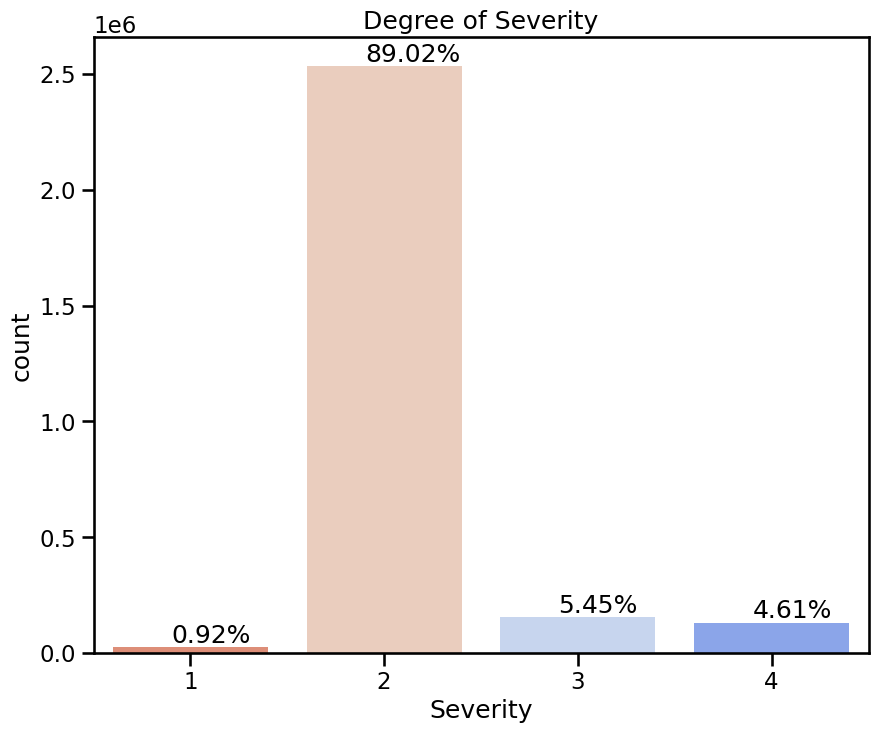

In [86]:
fig, ax = plt.subplots(figsize = (10,8))
c = sns.countplot(x="Severity", data = acs, palette = "coolwarm_r")
c.set_title("Degree of Severity")
for i in ax.patches:
    count = "{:.2%}".format(i.get_height()/len(acs.Severity))
    x = i.get_x()+i.get_width()-0.50
    y = i.get_height()+20000
    ax.annotate(count, (x, y))
plt.show()

### Analysis of the Road Condition

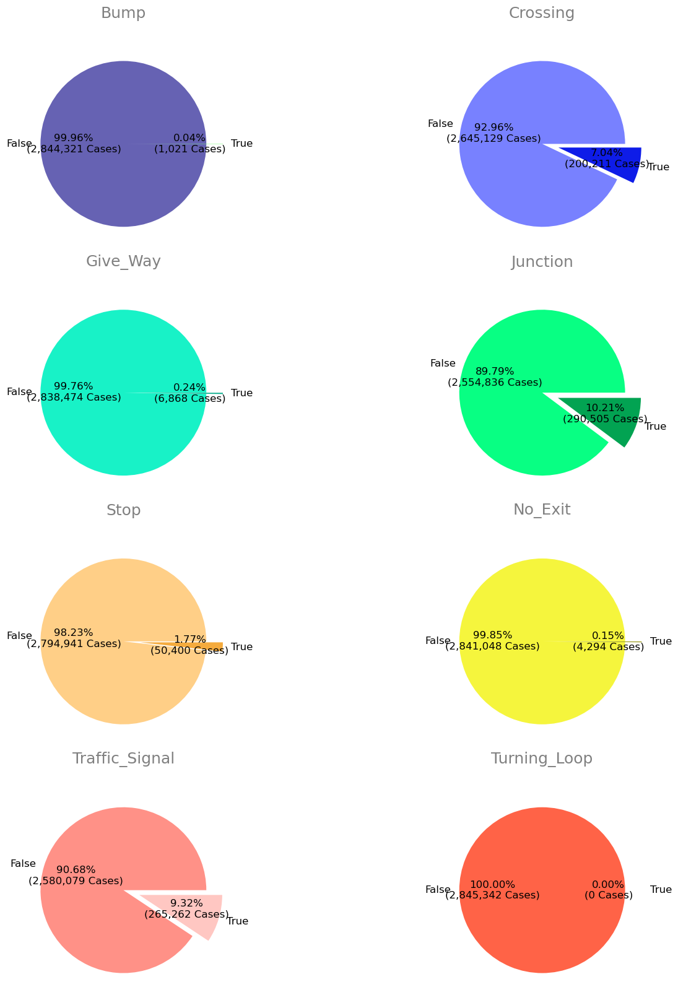

In [87]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(nrows=4, ncols=2, figsize=(16,20))

road = ['Bump', 'Crossing', 'Give_Way', 'Junction', 'Stop', 'No_Exit', 'Traffic_Signal', 'Turning_Loop']
colors = [('#6662b3', '#00FF00'), ('#7881ff', '#0e1ce8'), ('#18f2c7', '#09ad8c'), ('#08ff83', '#02a352'), ('#ffcf87', '#f5ab3d'),         ('#f5f53d', '#949410'), ('#ff9187', '#ffc7c2'), ('tomato', '#008000')]    
count = 0

def func(pct, allvals):
    absolute = int(round(pct/100*np.sum(allvals), 2))
    return "{:.2f}%\n({:,d} Cases)".format(pct, absolute)    

for i in [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8]:
    
    size = list(acs[road[count]].value_counts())
    if len(size) != 2:
        size.append(0)
    
    labels = ['False', 'True']
    
    title = '\n'.join([road[count], ''])

    i.pie(size, labels=labels, colors=colors[count],
          autopct=lambda pct: func(pct, size), labeldistance=1.1,
          textprops={'fontsize': 12}, explode=[0, 0.2])

    i.set_title(title, fontsize=18, color='grey')
    
    count += 1
    
plt.show()

#### Analysis of Road Conditions

1) The highest cases of road condition garnering at a total of 290,505 (10.21%) road accidents cases occurs in Junction

2) The highest cases of road condition garnering at a total of 265,262 (9.32%) road accidents cases occurs in Traffic Signal

3) The highest cases of road condition garnering at a total of 200,211 (7.04%) road accident cases occurs in Crossing

### Road Condtions by Severity

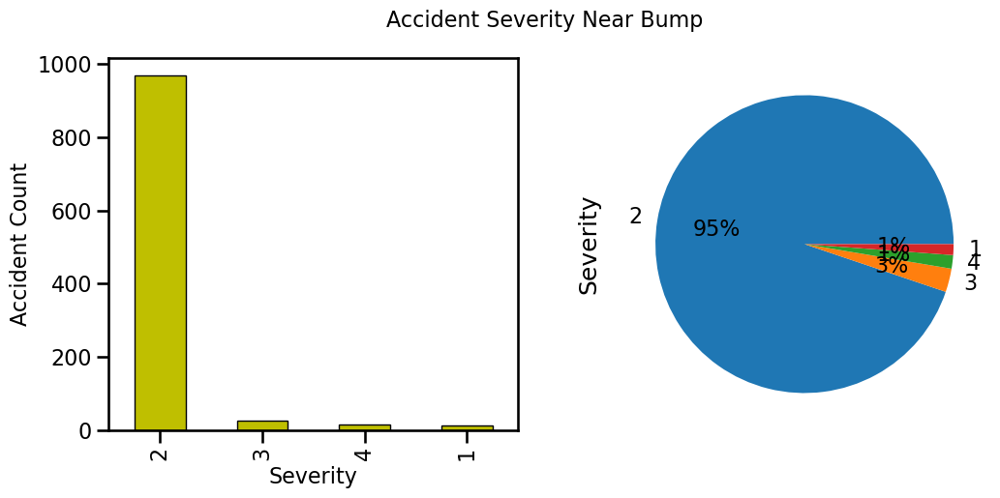

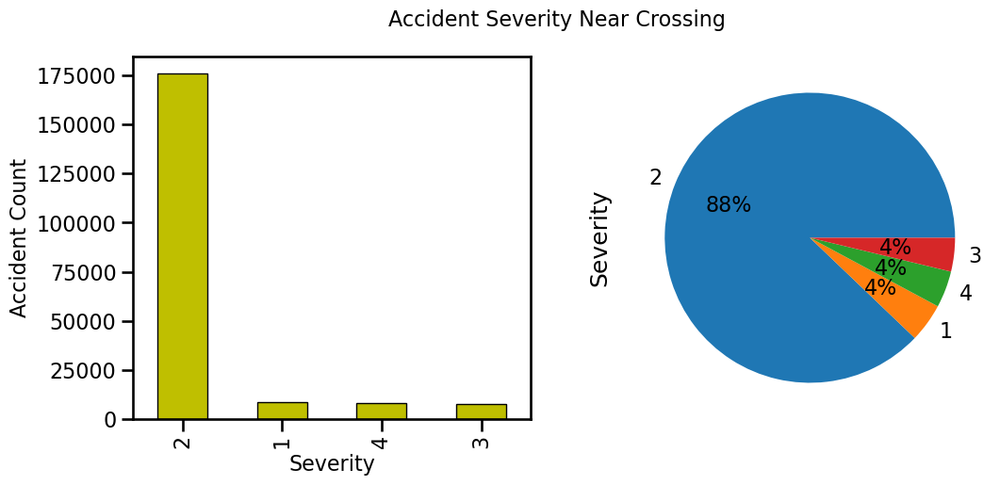

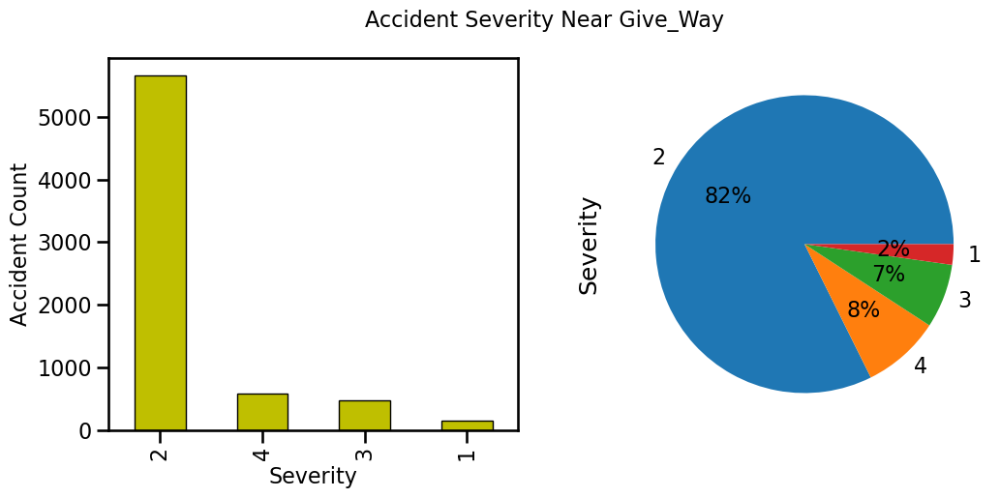

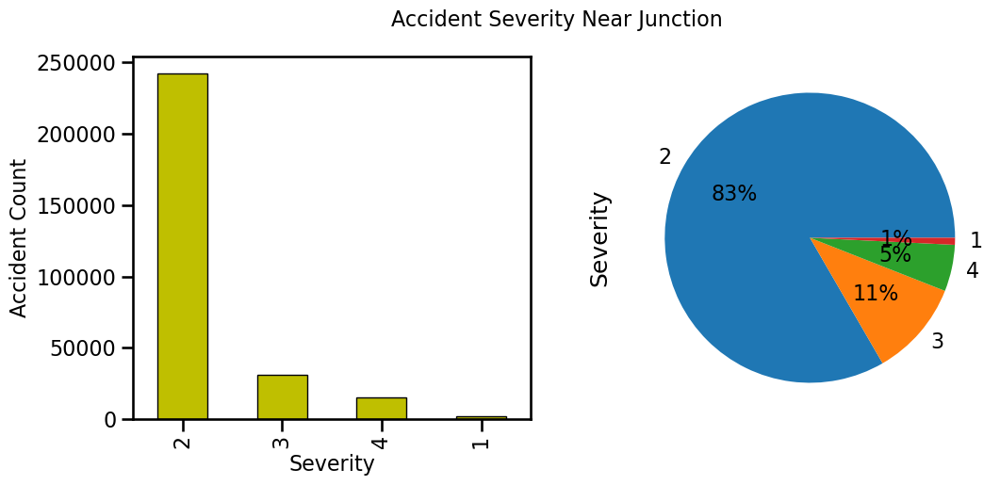

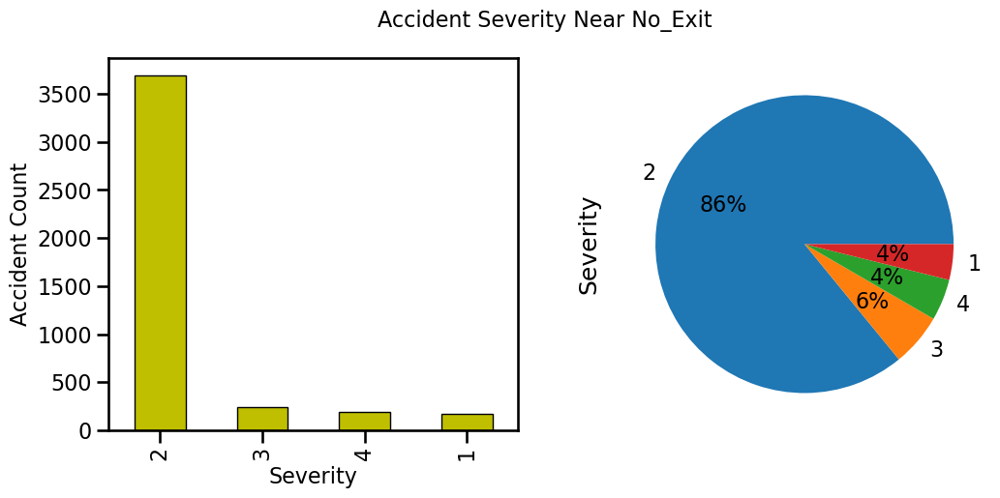

...

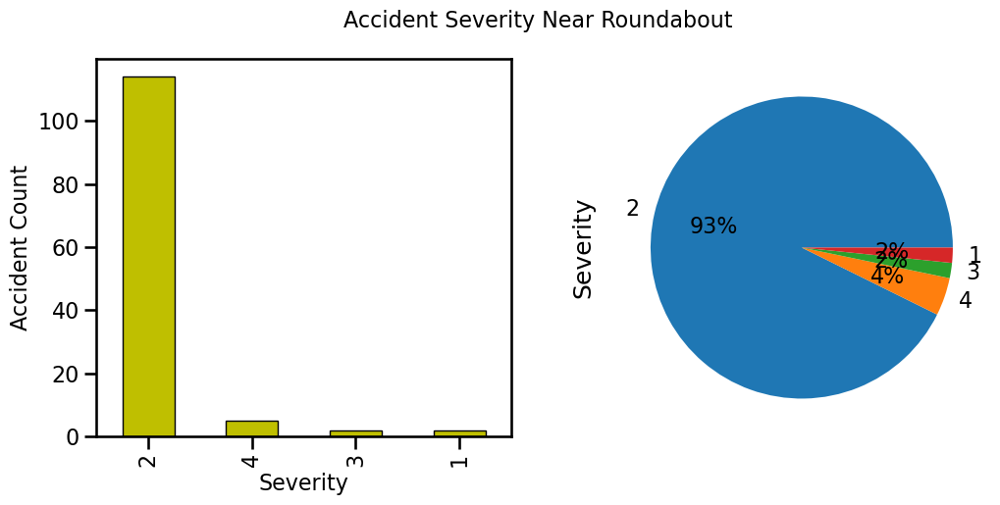

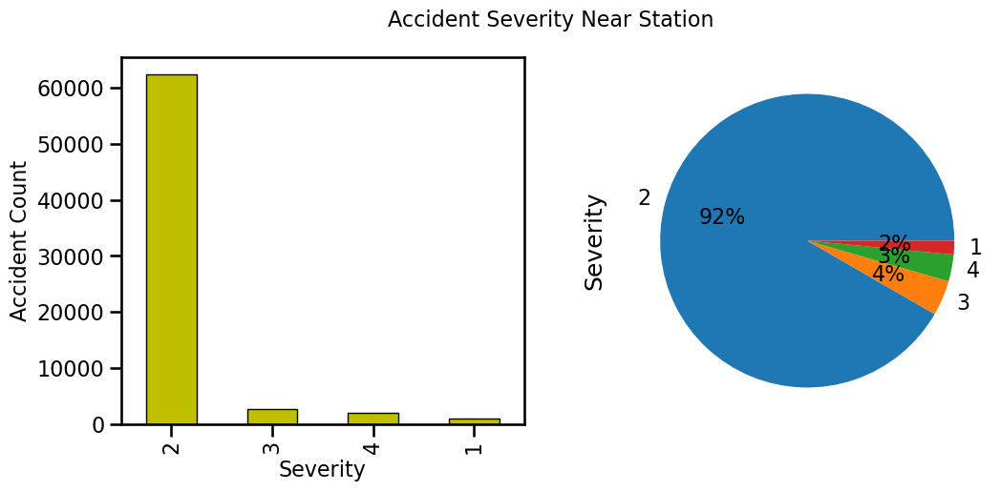

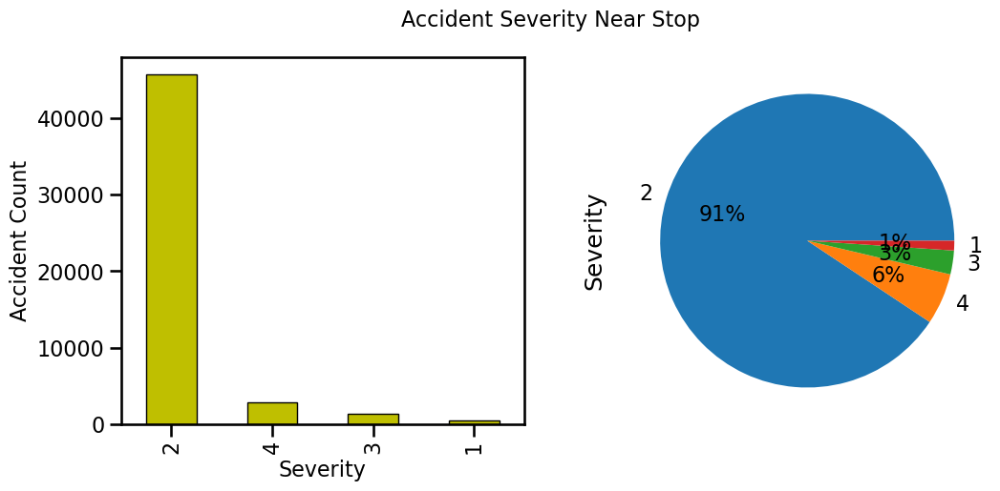

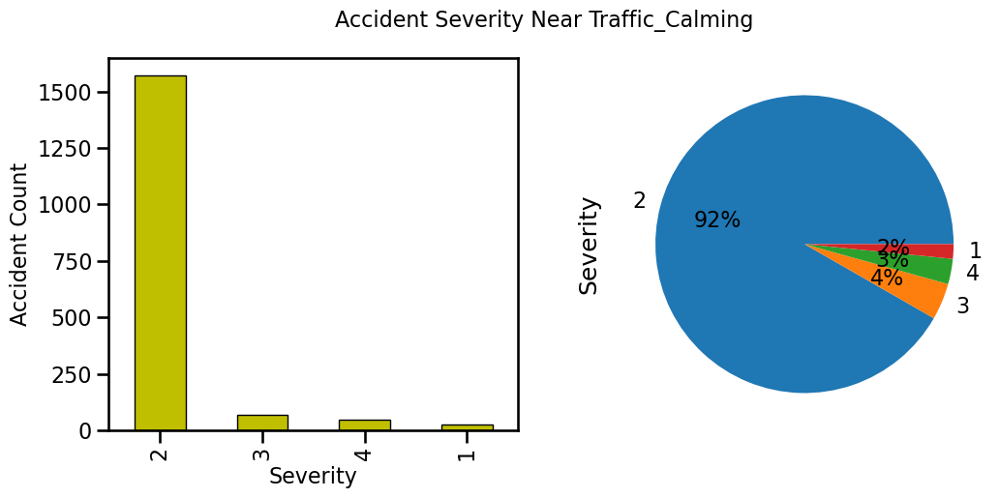

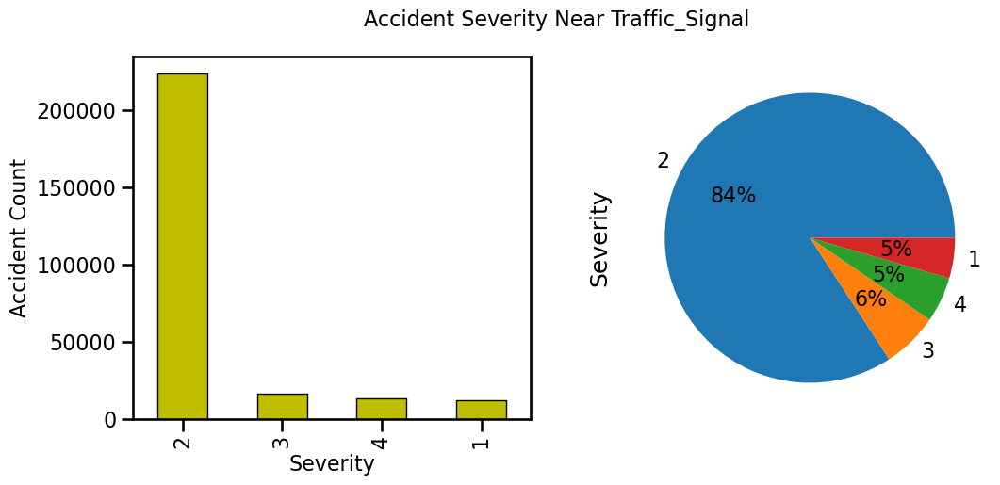

In [88]:
for s in ['Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop']:
    # check if infrastructure type is found in any record 
    if (acs[s] == True).sum() > 0:
        plt.subplots(1,2,figsize=(12,5))
        plt.xticks(fontsize=14)
        plt.suptitle('Accident Severity Near ' + s,fontsize=16)
        plt.subplot(1,2,1)
        acs.loc[acs[s] == True]['Severity'].value_counts().plot.bar(width=0.5,color='y',edgecolor='k',align='center',linewidth=1)
        plt.xlabel('Severity',fontsize=16)
        plt.ylabel('Accident Count',fontsize=16)
        plt.xticks(fontsize=16)
        plt.yticks(fontsize=16)
        plt.subplot(1,2,2)
        acs.loc[acs[s] == True]['Severity'].value_counts().plot.pie(autopct='%1.0f%%',fontsize=16)
        
    plt.show()

#### Analysis of Road Condtions by Severity

1) Severity 2 is the major factorial component of road accidents.

### Analysis of which Side of the Road: R or L

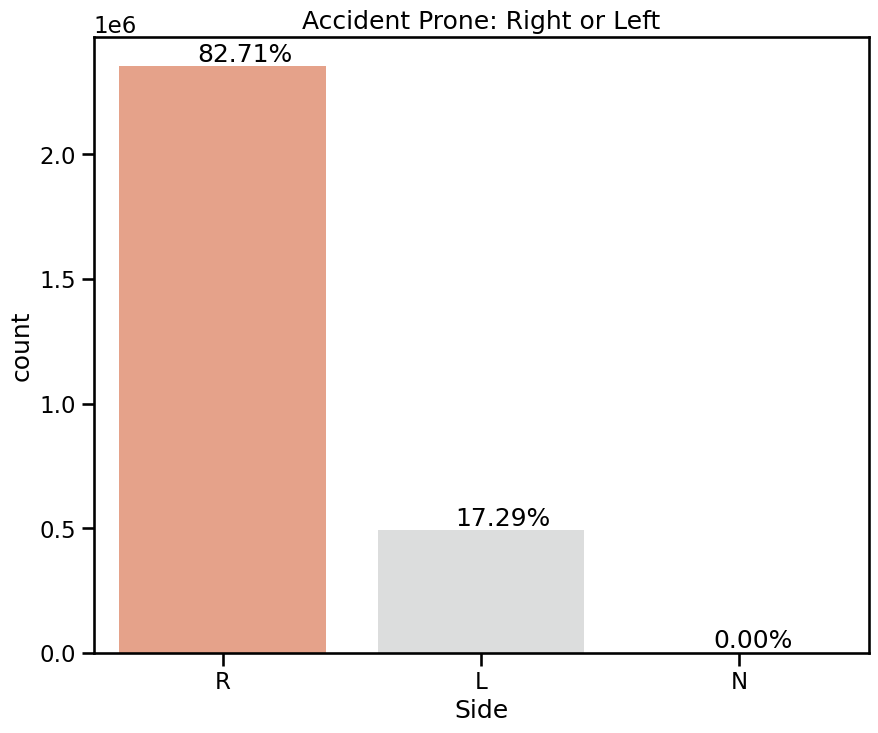

In [89]:
fig, ax = plt.subplots(figsize = (10,8))
c1 = sns.countplot(x="Side", data = acs, palette = "coolwarm_r")
c1.set_title("Accident Prone: Right or Left")
for i in ax.patches:
    count = "{:.2%}".format(i.get_height()/len(acs.Side))
    x = i.get_x()+i.get_width()-0.50
    y = i.get_height()+20000
    ax.annotate(count, (x, y))
plt.show()

#### Analysis of which Side of the Road: R or L

1) There are more accidents occurring within the right side of the road, garnering at 82.71% which is 5,030,523 cases.

2) The left side of the road caused 17.29% of the road accident which is 1,051,598 cases.

## Correlation of the Variables

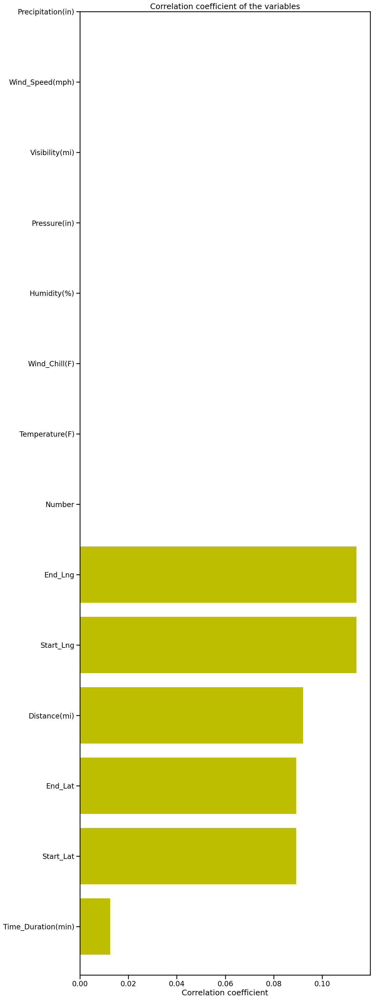

In [90]:
x_cols = [col for col in acs.columns if col not in ['Severity'] if acs[col].dtype=='float64']

labels = []
values = []
for col in x_cols:
    labels.append(col)
    values.append(np.corrcoef(acs[col].values, acs.Severity.values)[0,1])
corr_acs = pd.DataFrame({'col_labels':labels, 'corr_values':values})
corr_acs = corr_acs.sort_values(by='corr_values')

ind = np.arange(len(labels))
width = 0.9
fig, ax = plt.subplots(figsize=(12,40))
rects = ax.barh(ind, np.array(corr_acs.corr_values.values), color='y')
ax.set_yticks(ind)
ax.set_yticklabels(corr_acs.col_labels.values, rotation='horizontal')
ax.set_xlabel("Correlation coefficient")
ax.set_title("Correlation coefficient of the variables")
plt.show()

In [91]:
correlation = acs.corr().unstack().sort_values(kind="quicksort", ascending=False)

correlation = correlation[correlation!=1]
print("Top 20 with highest positive correlation")
print(correlation[:20])
print("Top 20 with highest negative correlation")
print(correlation[-20:][::-1])

Top 20 with highest positive correlation
End_Lng          Start_Lng          0.999999
Start_Lng        End_Lng            0.999999
Start_Lat        End_Lat            0.999995
End_Lat          Start_Lat          0.999995
Wind_Chill(F)    Temperature(F)     0.993857
Temperature(F)   Wind_Chill(F)      0.993857
Bump             Traffic_Calming    0.772162
Traffic_Calming  Bump               0.772162
Traffic_Signal   Crossing           0.422232
Crossing         Traffic_Signal     0.422232
Wind_Chill(F)    Year               0.237869
Year             Wind_Chill(F)      0.237869
Visibility(mi)   Wind_Chill(F)      0.217573
Wind_Chill(F)    Visibility(mi)     0.217573
Temperature(F)   Visibility(mi)     0.211134
Visibility(mi)   Temperature(F)     0.211134
Pressure(in)     End_Lng            0.208830
End_Lng          Pressure(in)       0.208830
Start_Lng        Pressure(in)       0.208828
Pressure(in)     Start_Lng          0.208828
dtype: float64
Top 20 with highest negative correlation
Day

## Correlation Matrix

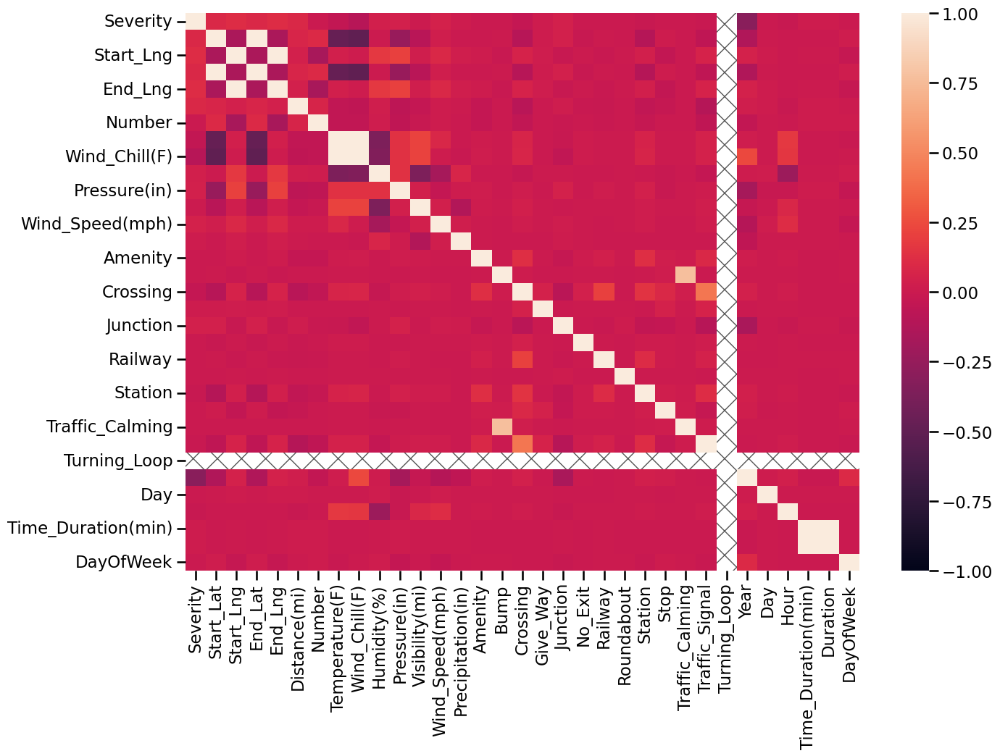

In [92]:
corr_matrix = acs.corr()

plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, vmin=-1, vmax=1)
plt.gca().patch.set(hatch="X", edgecolor="#555")
plt.show()